**Importing Libraries**

Installing library

In [ ]:
# !pip install spacy-transformers


                                              0.0/343.7 kB ? eta -:--:--
     ---                                   30.7/343.7 kB 640.0 kB/s eta 0:00:01
     ---                                   30.7/343.7 kB 640.0 kB/s eta 0:00:01
     ---                                   30.7/343.7 kB 640.0 kB/s eta 0:00:01
     ------                                61.4/343.7 kB 326.1 kB/s eta 0:00:01
     ---------                             92.2/343.7 kB 401.6 kB/s eta 0:00:01
     ---------                             92.2/343.7 kB 401.6 kB/s eta 0:00:01
     ---------------                      143.4/343.7 kB 425.3 kB/s eta 0:00:01
     -----------------                    163.8/343.7 kB 466.9 kB/s eta 0:00:01
     ------------------                   174.1/343.7 kB 402.6 kB/s eta 0:00:01
     ---------------------                204.8/343.7 kB 414.8 kB/s eta 0:00:01
     -----------------------              225.3/343.7 kB 458.5 kB/s eta 0:00:01
     -------------------------            245.8


[notice] A new release of pip is available: 23.1.2 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [1]:
import spacy
from spacy import displacy
import json


Merging the annotations in one file
Delete files  with "empty" extensions before merging

In [ ]:
# import json
# import glob

# def merge_json_files(directory_path):
#     json_files = glob.glob(f"{directory_path}/*.json")
#     merged_annotations = []
#     classes = None

#     for filepath in json_files:
#         with open(filepath, 'r', encoding='utf-8') as file:
#             data = json.load(file)
#             # Filter out None (null in JSON) values from annotations
#             non_null_annotations = [annotation for annotation in data['annotations'] if annotation is not None]
#             merged_annotations.extend(non_null_annotations)

#             if not classes:
#                 classes = data['classes']

#     merged_data = {
#         'classes': classes,
#         'annotations': merged_annotations
#     }

#     with open('merged_file_all_annotaions.json', 'w', encoding='utf-8') as file:
#         json.dump(merged_data, file, indent=4)

# # Example usage
# directory_path = 'new_data_weather_annotations/JSONS/'  # Replace with the path to your JSON files
# merge_json_files(directory_path)


**Loading annotaton file**

In [2]:

with open('merged_file_all_annotaions.json', 'r', encoding='utf-8') as f:
    data = json.load(f)

In [3]:
data

{'classes': ['CROP TYPES',
  'LIVESTOCK',
  'TECHNOLOGIES',
  'DISEASE AND PEST OUTBREAKS',
  'WATER'],
 'annotations': [['Fruit, vegetables and cereals\r',
   {'entities': [[0, 5, 'CROP TYPES'],
     [7, 17, 'CROP TYPES'],
     [22, 29, 'CROP TYPES']]}],
  ['\r', {'entities': []}],
  ['Vegetable\r', {'entities': [[0, 9, 'CROP TYPES']]}],
  ['\r', {'entities': []}],
  ['GREECE\r', {'entities': []}],
  ['\r', {'entities': []}],
  ['- "ΦΑΣΟΛΙΑ ΓΙΓΑΝΤΕΣ - ΕΛΕΦΑΝΤΕΣ ΚΑΣΤΟΡΙΑΣ (Fasolia Gigantes - Elefantes Kastorias)" (PGI)\r',
   {'entities': []}],
  ['\r', {'entities': []}],
  ['ANNEX II\r', {'entities': []}],
  ['\r', {'entities': []}],
  ['COUNCIL REGULATION (EEC) No 2081/92\r', {'entities': []}],
  ['\r', {'entities': []}],
  ['APPLICATION FOR REGISTRATION: ARTICLE 5\r', {'entities': []}],
  ['\r', {'entities': []}],
  ['PDO ( ) PGI (X)\r', {'entities': []}],
  ['\r', {'entities': []}],
  ['National application No: EL-04/00-5\r', {'entities': []}],
  ['\r', {'entities': []}],
  ['1. Re

In [4]:
data['classes']

['CROP TYPES',
 'LIVESTOCK',
 'TECHNOLOGIES',
 'DISEASE AND PEST OUTBREAKS',
 'WATER']

**Preprocessing with annotatons**

In [5]:
len(data['annotations'])

26694

In [6]:
data['annotations'][0][0]

'Fruit, vegetables and cereals\r'

In [7]:
# Convert to a list of tuples
entities_tuples = [tuple(entity) for entity in data['annotations'][0][1]['entities']]
entities_tuples

[(0, 5, 'CROP TYPES'), (7, 17, 'CROP TYPES'), (22, 29, 'CROP TYPES')]

**Making the annotations in format that is needed by model**

In [8]:
# Initialize an empty list for training data
training_data = []

# Iterate over each item in data['annotations']
for i in range(len(data['annotations'])):
    # Extract text and entities
    text = data['annotations'][i][0]
    entities_tuples = [tuple(entity) for entity in data['annotations'][i][1]['entities']]

    # Create a dictionary and append it to training_data
    training_data.append({'text': text, 'entities': entities_tuples})


**Annotation_text**

In [9]:
training_data[0]['text']

'Fruit, vegetables and cereals\r'

**Annotation entities**

In [10]:
training_data[0]['entities']

[(0, 5, 'CROP TYPES'), (7, 17, 'CROP TYPES'), (22, 29, 'CROP TYPES')]

**Loading new spacy model to get trained**

In [11]:

from spacy.tokens import DocBin
from tqdm import tqdm

nlp = spacy.blank("en") # load a new spacy model
doc_bin = DocBin()


**Convert data in spacy format so model can load and train**

In [12]:

from spacy.util import filter_spans

for training_example  in tqdm(training_data):
    text = training_example['text']
    labels = training_example['entities']
    doc = nlp.make_doc(text)
    ents = []
    for start, end, label in labels:
        span = doc.char_span(start, end, label=label, alignment_mode="contract")
        if span is None:
            print("Skipping entity")
        else:
            ents.append(span)
    filtered_ents = filter_spans(ents)
    doc.ents = filtered_ents
    doc_bin.add(doc)

doc_bin.to_disk("train_all.spacy")

  0%|          | 0/26694 [00:00<?, ?it/s]

 60%|██████    | 16081/26694 [00:00<00:00, 19231.90it/s]

Skipping entity
Skipping entity
Skipping entity
Skipping entity
Skipping entity


100%|██████████| 26694/26694 [00:01<00:00, 18701.20it/s]


**Create config file from there https://spacy.io/usage/training#quickstart ,**



In [ ]:
!python -m spacy init fill-config base_config.cfg config.cfg

✔ Auto-filled config with all values
✔ Saved config
config.cfg
You can now add your data and train your pipeline:
python -m spacy train config.cfg --paths.train ./train.spacy --paths.dev ./dev.spacy


**It will start training the model**

You can see loss,  scores at end of epochs

where train_all is the data stored in spacy format

In [ ]:
!python -m spacy train config.cfg --output ./ --paths.train ./train_all.spacy --paths.dev ./train_all.spacy

^C


when above code will run it will save the best model
Load the folder that will be save with the name of best model

If you already done with model load from below and make it

If you already done with model load from here

**Loading the model**

In [13]:
import spacy
from spacy import displacy
import json

In [14]:
nlp_ner = spacy.load("./model-best")

c:\Users\Admin\AppData\Local\Programs\Python\Python312\Lib\site-packages\spacy\util.py:910: UserWarning: [W095] Model 'en_pipeline' (0.0.0) was trained with spaCy v3.6.1 and may not be 100% compatible with the current version (3.7.2). If you see errors or degraded performance, download a newer compatible model or retrain your custom model with the current spaCy version. For more details and available updates, run: python -m spacy validate
  warnings.warn(warn_msg)


**Loading the cleaned dataset**

In [15]:
import pandas as pd
path="./clean_sorted_legal_acts.csv"
df=pd.read_csv(path, sep='|')

In [16]:
len(df)

15319

**Convert the date column to datetime format**

In [17]:
df['date'] = pd.to_datetime(df['date'])

df = df[(df['date'] >= '2000-01-01') & (df['date'] <= '2020-12-31')]

In [18]:
pd.set_option('display.max_rows', None)


**Counting of values articles for each month**

Renaming dataframe values to also make graphs out of it.

In [19]:
import calendar

# This function converts month numbers to names
df['month_name'] = df['date'].dt.month.apply(lambda x: calendar.month_name[x])

# Group by year and the new month_name column
monthly_counts = df.groupby([df['date'].dt.year, 'month_name']).size()
monthly_counts = monthly_counts.reset_index()
monthly_counts = monthly_counts.rename(columns={0: 'count'})
monthly_counts['year_month'] = monthly_counts['date'].astype(str) + ' ' + monthly_counts['month_name']


In [20]:
import calendar

In [21]:
print(monthly_counts)


     date month_name  count      year_month
0    2000   December      1   2000 December
1    2000       July      1       2000 July
2    2000      March      1      2000 March
3    2000        May      1        2000 May
4    2001        May      2        2001 May
5    2001   November      1   2001 November
6    2002   December      1   2002 December
7    2002    January      2    2002 January
8    2002    October      1    2002 October
9    2002  September      1  2002 September
10   2003   December      4   2003 December
11   2003   February      2   2003 February
12   2003    January      1    2003 January
13   2003       July      1       2003 July
14   2003        May      3        2003 May
15   2003   November      1   2003 November
16   2003    October      2    2003 October
17   2004      April     44      2004 April
18   2004     August    144     2004 August
19   2004   December    159   2004 December
20   2004   February      3   2004 February
21   2004    January      4    2

**Plotting the matplotlib graph for monthly rows for each month**

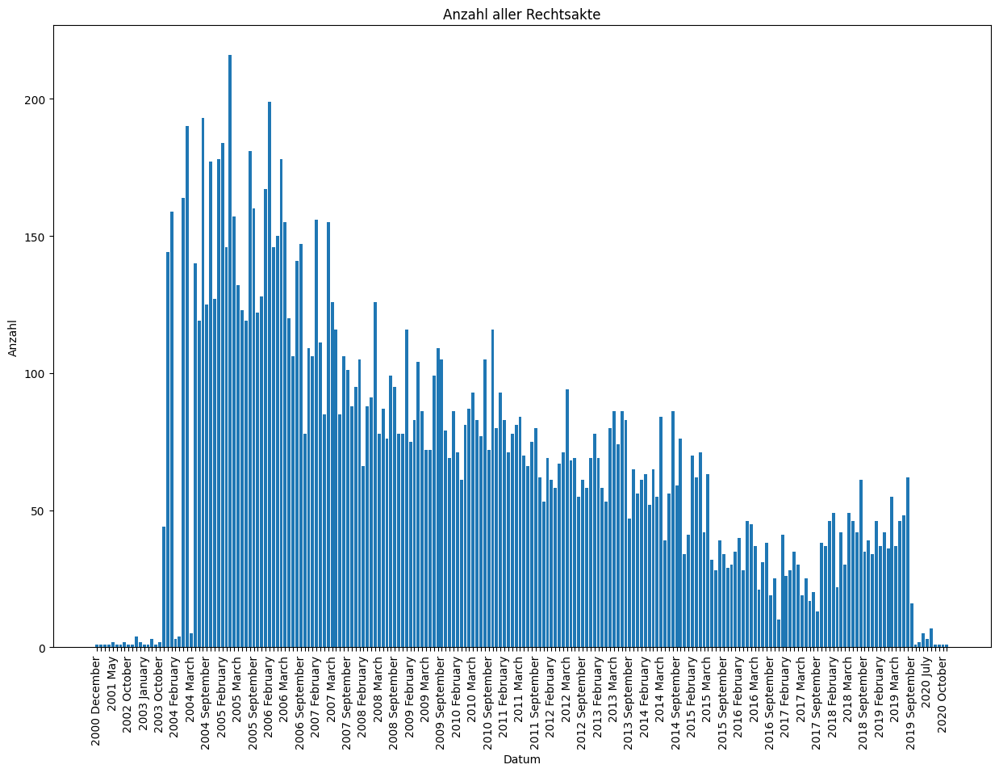

In [22]:
import matplotlib.pyplot as plt

# Assuming monthly_counts['year_month'] is your x-axis data
# Generate a list of labels, where every sixth month is labeled and others are empty strings
labels = [label if i % 4 == 0 else '' for i, label in enumerate(monthly_counts['year_month'])]

plt.figure(figsize=(15, 10))
plt.bar(monthly_counts['year_month'], monthly_counts['count'])
plt.xlabel('Datum')
plt.ylabel('Anzahl')
plt.title('Anzahl aller Rechtsakte')

# Set the custom labels
plt.xticks(ticks=monthly_counts['year_month'], labels=labels, rotation=90)

plt.show()


In [25]:
!pip install scikit-learn

  Obtaining dependency information for scikit-learn from https://files.pythonhosted.org/packages/76/d8/02fa68de37f657e6bb241e6f9ec6240bafa43222d3ef836a248145d9548f/scikit_learn-1.4.1.post1-cp312-cp312-win_amd64.whl.metadata
  Obtaining dependency information for scipy>=1.6.0 from https://files.pythonhosted.org/packages/f3/31/91a2a3c5eb85d2bfa86d7c98f2df5d77dcdefb3d80ca9f9037ad04393acf/scipy-1.12.0-cp312-cp312-win_amd64.whl.metadata
     ---------------------------------------- 0.0/60.4 kB ? eta -:--:--
     ------ --------------------------------- 10.2/60.4 kB ? eta -:--:--
     ---------------------------------------- 60.4/60.4 kB 1.1 MB/s eta 0:00:00
  Obtaining dependency information for joblib>=1.2.0 from https://files.pythonhosted.org/packages/10/40/d551139c85db202f1f384ba8bcf96aca2f329440a844f924c8a0040b6d02/joblib-1.3.2-py3-none-any.whl.metadata
  Obtaining dependency information for threadpoolctl>=2.0.0 from https://files.pythonhosted.org/packages/b1/2c/f504e55d98418f2fcf756a56


[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [45]:
# import matplotlib.pyplot as plt

# plt.figure(figsize=(15, 10))
# plt.bar(monthly_counts['year_month'], monthly_counts['count'])
# plt.xlabel('Year and Month')
# plt.ylabel('Count')
# plt.title('Monthly Row Counts')
# plt.xticks(rotation=90)
# plt.show()


**Filtering data being used for analysics**

In [25]:
# df_filtered = df[(df['date'] >= '2019-01-01') &
#                         (df['date'] <= '2019-12-31')]

df_filtered = df


    Textdaten für jeden Monat extrahieren: Zuerst extrahieren wir den gesamten Text für jeden Monat. Da wir dem Modell keine Texte mit mehr als 100.000 Zeichen übergeben können, teilen wir unsere Textdaten in monatliche Chargen auf.

    Aufteilung der Textdaten in monatliche Chargen: Die Textdaten für jeden Monat werden in kleinere Chargen aufgeteilt, um sicherzustellen, dass sie weniger als 100.000 Zeichen enthalten. Dies ermöglicht es uns, sie effizienter an das Modell zu übergeben.

    Speichern der Ergebnisse in einem Wörterbuch: Nachdem wir die Textdaten für jeden Monat in Chargen aufgeteilt haben, verwenden wir unser Wörterbuch monthly_class_counts, um die Ergebnisse für jeden Monat zu speichern. Auf diese Weise können wir die Ergebnisse später leicht abrufen und analysieren.

In [26]:
import pandas as pd
from collections import defaultdict

# Assuming df_filtered is already defined and nlp_ner is your NLP model

# Convert 'date' to datetime and set it as index
df_filtered['date'] = pd.to_datetime(df_filtered['date'])
df_filtered.set_index('date', inplace=True)

# Function to process text chunks
def process_text(text, nlp_model):
    doc = nlp_model(text)
    counts = defaultdict(int)
    for ent in doc.ents:
        counts[ent.label_] += 1
    return counts

# Initialize a dictionary to store the monthly data
monthly_class_counts = defaultdict(dict)

# Maximum length for a text chunk
MAX_LENGTH = 1000000

# Iterate over each month
for month, group in df_filtered.groupby(pd.Grouper(freq='M')):
    merged_text = ' '.join(group['text'].astype(str))

    # Split the text into chunks
    chunks = [merged_text[i:i+MAX_LENGTH] for i in range(0, len(merged_text), MAX_LENGTH)]

    # Initialize a dictionary for the month's counts
    month_counts = defaultdict(int)

    # Process each chunk
    for chunk in chunks:
        chunk_counts = process_text(chunk, nlp_ner)
        # Combine the counts from each chunk
        for label, count in chunk_counts.items():
            month_counts[label] += count

    # Store the counts in the monthly_class_counts dictionary
    monthly_class_counts[month.strftime('%Y-%m')] = dict(month_counts)

# Convert to JSON if needed
import json
json_output = json.dumps(monthly_class_counts, indent=4)

In [27]:
 #Save the counts to a JSON file
with open('monthly_class_counts.json', 'w') as outfile:
    json.dump(monthly_class_counts, outfile, indent=4)

In [28]:
# Save to CSV file
df.to_csv('monthly_class_counts.csv')

**Just reading the file, if you dont want to run the prediction process again and again**

In [27]:
# # Open the file for reading
# with open('julius.json', 'r', encoding='utf-8') as f:
#     # Load the JSON data from the file
#     monthly_class_counts = json.load(f)



In [29]:
monthly_class_counts

defaultdict(dict,
            {'2000-03': {'CROP TYPES': 2},
             '2000-04': {},
             '2000-05': {'CROP TYPES': 30, 'WATER': 2, 'LIVESTOCK': 2},
             '2000-06': {},
             '2000-07': {'CROP TYPES': 3},
             '2000-08': {},
             '2000-09': {},
             '2000-10': {},
             '2000-11': {},
             '2000-12': {'LIVESTOCK': 1, 'CROP TYPES': 10},
             '2001-01': {},
             '2001-02': {},
             '2001-03': {},
             '2001-04': {},
             '2001-05': {'DISEASE AND PEST OUTBREAKS': 25,
              'LIVESTOCK': 110,
              'TECHNOLOGIES': 8,
              'CROP TYPES': 6},
             '2001-06': {},
             '2001-07': {},
             '2001-08': {},
             '2001-09': {},
             '2001-10': {},
             '2001-11': {},
             '2001-12': {},
             '2002-01': {'CROP TYPES': 94,
              'WATER': 10,
              'DISEASE AND PEST OUTBREAKS': 1},
             '

If you want to skip any categroy,  just write all categories that must be included

In [30]:
# Categories to include
categories = ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]
# categories = ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS"]
# Initialize a new dict to hold filtered counts
monthly_class_counts = {month: {cat: monthly_class_counts[month].get(cat, 0) for cat in categories}
                   for month in monthly_class_counts}

Converting that dictionary in dataframe,  and plotting it,  based on months on x axis and counts on y axis

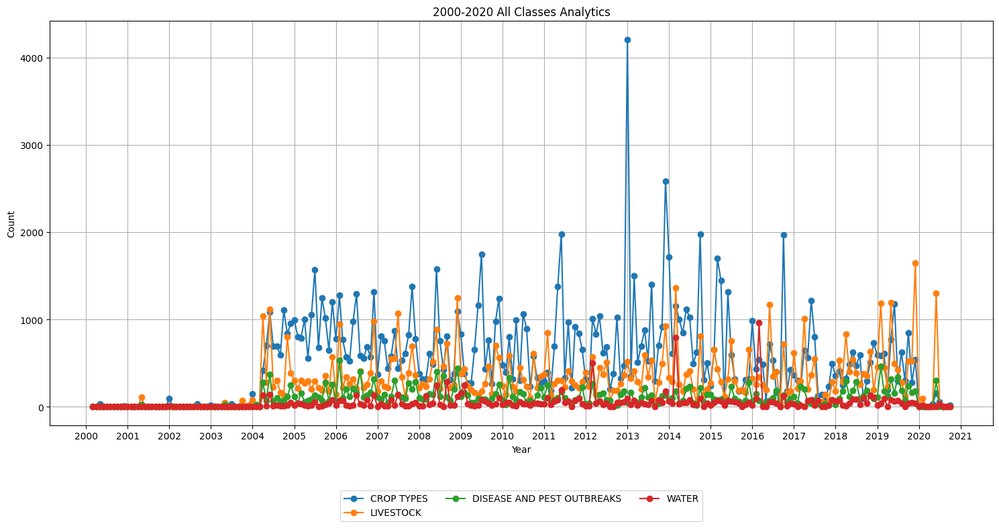

In [31]:
# Convert to DataFrame
import matplotlib.dates as mdates
df = pd.DataFrame(monthly_class_counts).T
df.index = pd.to_datetime(df.index)



plt.figure(figsize=(15, 8))
for column in df.columns:
    plt.plot(df.index, df[column], marker='o', label=column)

# Set the x-axis to have a tick for every year
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.title('2000-2020 All Classes Analytics')
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)  # Legend at the bottom
plt.grid(True)
plt.tight_layout()

plt.show()



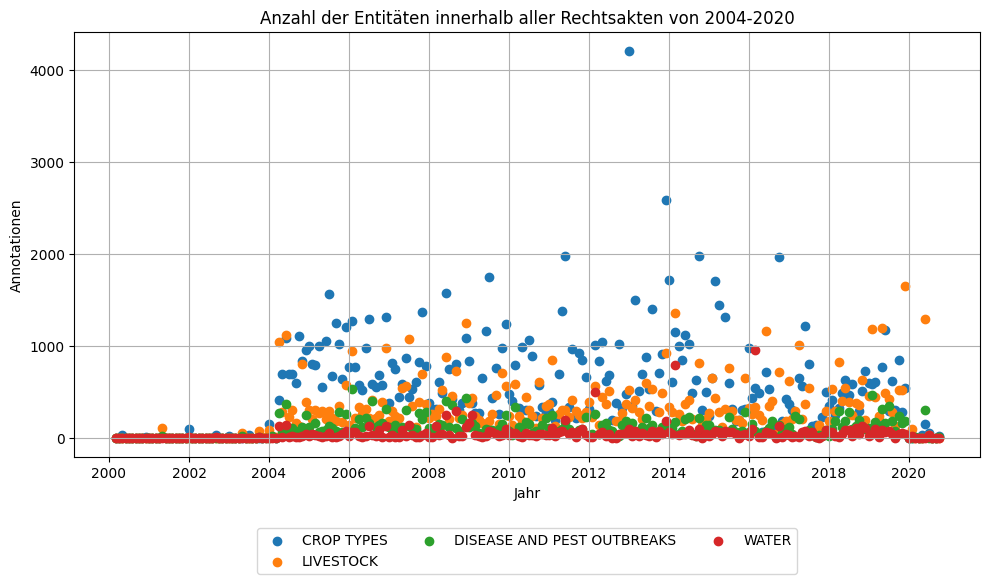

In [34]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Convert to DataFrame
df = pd.DataFrame(monthly_class_counts).T
df.index = pd.to_datetime(df.index)

plt.figure(figsize=(10, 6))

# Iterate over each column in the DataFrame
for column in df.columns:
    # Create a scatter plot for each column
    plt.scatter(df.index, df[column], label=column)

# Set the x-axis to have a tick for every year
plt.gca().xaxis.set_major_locator(mdates.YearLocator(base=2))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.title('Anzahl der Entitäten innerhalb aller Rechtsakten von 2004-2020')
plt.xlabel('Jahr')
plt.ylabel('Annotationen')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)  # Legend at the bottom
plt.grid(True)
plt.tight_layout()

plt.show()

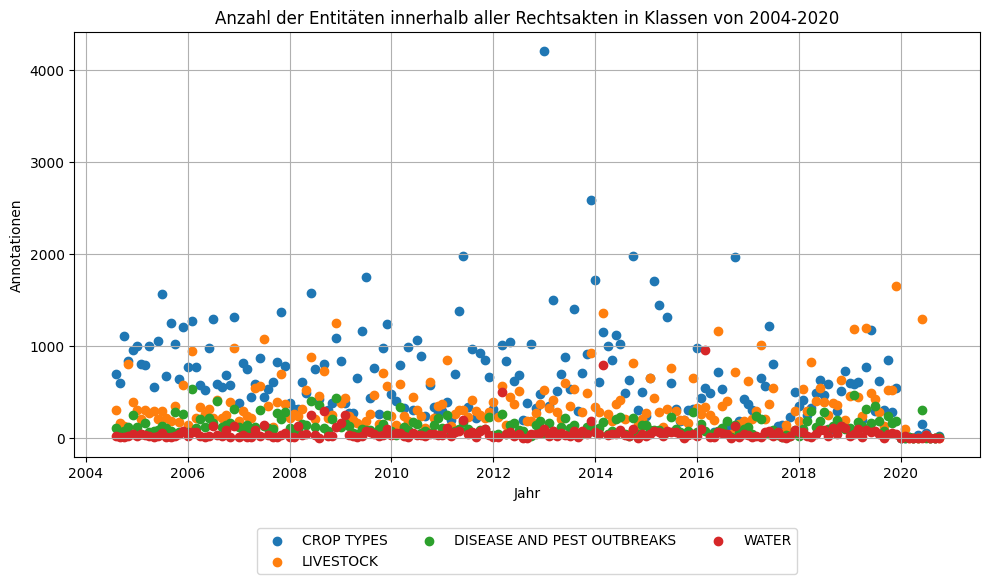

In [36]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Convert to DataFrame
df = pd.DataFrame(monthly_class_counts).T
df.index = pd.to_datetime(df.index)

# Filter data from August 2004 till the end
start_date = pd.Timestamp('2004-08-01')
df = df[df.index >= start_date]

plt.figure(figsize=(10, 6))

# Iterate over each column in the DataFrame
for column in df.columns:
    # Create a scatter plot for each column
    plt.scatter(df.index, df[column], label=column)

# Set the x-axis to have a tick for every year
plt.gca().xaxis.set_major_locator(mdates.YearLocator(base=2))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.title('Anzahl der Entitäten innerhalb aller Rechtsakten in Klassen von 2004-2020')
plt.xlabel('Jahr')
plt.ylabel('Annotationen')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)  # Legend at the bottom
plt.grid(True)
plt.tight_layout()

plt.show()


**Plotting the same graph based on percentages instead of count**

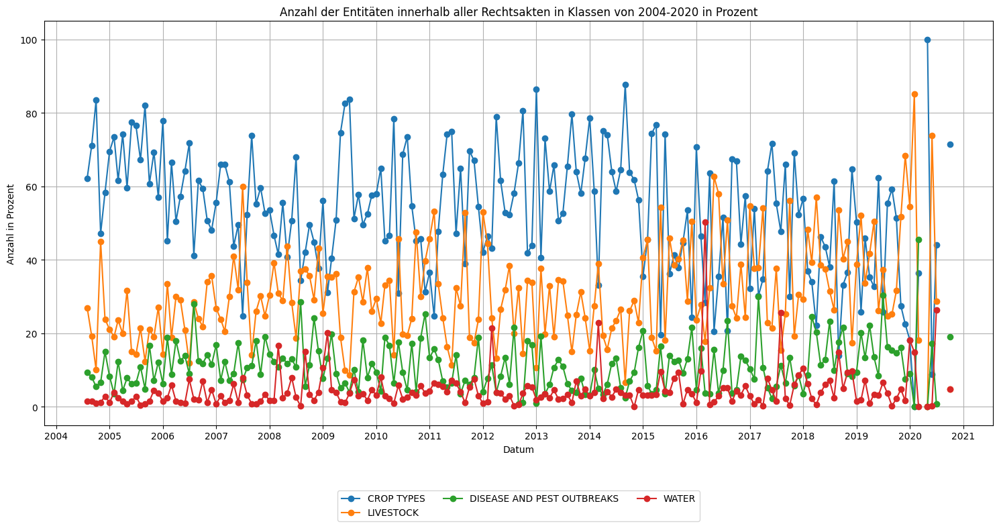

In [37]:
# Calculate percentage for each class over each month
df_percent = df.div(df.sum(axis=1), axis=0) * 100


# Filter data from August 2004 till the end
start_date = pd.Timestamp('2004-08-01')
df = df[df.index >= start_date]

plt.figure(figsize=(15, 8))
for column in df_percent.columns:
    plt.plot(df_percent.index, df_percent[column], marker='o', label=column)

# Set the x-axis to have a tick for every year
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.title('Anzahl der Entitäten innerhalb aller Rechtsakten in Klassen von 2004-2020 in Prozent')
plt.xlabel('Datum')
plt.ylabel('Anzahl in Prozent')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)  # Legend at the bottom
plt.grid(True)
plt.tight_layout()

plt.show()

**Rumspielen**

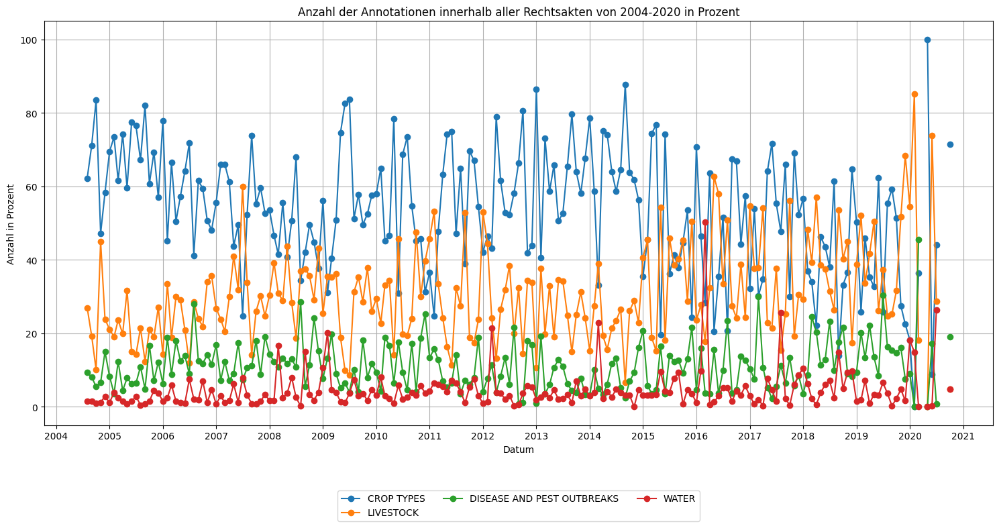

In [84]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Calculate percentage for each class over each month
df_percent = df.div(df.sum(axis=1), axis=0) * 100

# Filter data from August 2004 till the end
start_date = pd.Timestamp('2004-08-01')
df = df[df.index >= start_date]

plt.figure(figsize=(15, 8))
for column in df_percent.columns:
    plt.plot(df_percent.index, df_percent[column], marker='o', label=column)

# Set the x-axis to have a tick for every year
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.title('Anzahl der Annotationen innerhalb aller Rechtsakten von 2004-2020 in Prozent')
plt.xlabel('Datum')
plt.ylabel('Anzahl in Prozent')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)  # Legend at the bottom
plt.grid(True)
plt.tight_layout()

# Save the results to a CSV file
df_percent.to_csv('class_percentages.csv')

plt.show()


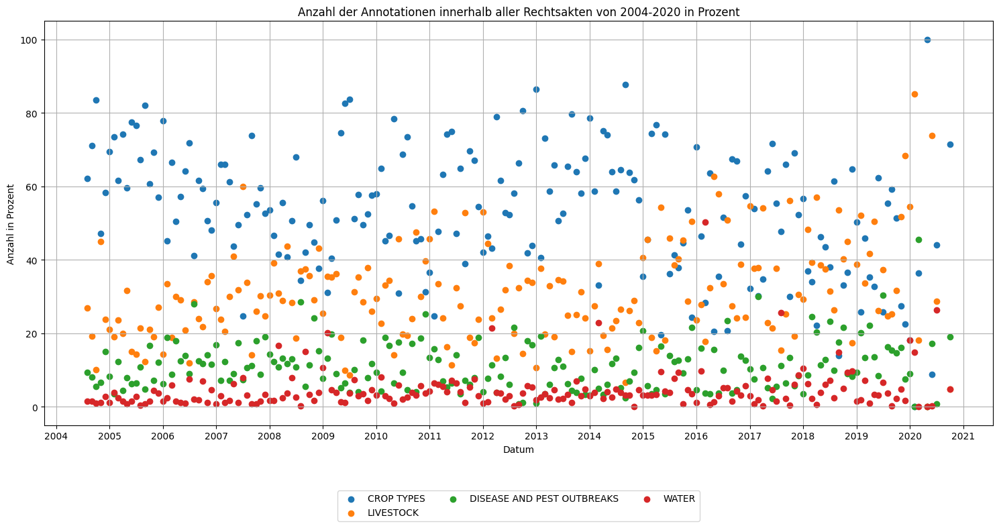

In [36]:
# Calculate percentage for each class over each month
df_percent = df.div(df.sum(axis=1), axis=0) * 100

# Filter data from August 2004 till the end
start_date = pd.Timestamp('2004-08-01')
df_percent = df_percent[df_percent.index >= start_date]

plt.figure(figsize=(15, 8))
for column in df_percent.columns:
    plt.scatter(df_percent.index, df_percent[column], marker='o', label=column)

# Set the x-axis to have a tick for every year
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.title('Anzahl der Annotationen innerhalb aller Rechtsakten von 2004-2020 in Prozent')
plt.xlabel('Datum')
plt.ylabel('Anzahl in Prozent')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)  # Legend at the bottom
plt.grid(True)
plt.tight_layout()

plt.show()


**Interactive graph with plotly for counting**

In [43]:
# Updating package if required
# !pip install --upgrade nbformat

In [44]:
import plotly.express as px
import pandas as pd
from collections import defaultdict



# Assuming df is your DataFrame
df = pd.DataFrame(monthly_class_counts).T
df.index = pd.to_datetime(df.index)
df.reset_index(inplace=True)
df.rename(columns={'index': 'Date'}, inplace=True)

# Melting DataFrame for Plotly
df_melted = df.melt(id_vars='Date', var_name='Class', value_name='Count')

# Plotting with Plotly
fig = px.line(df_melted, x='Date', y='Count', color='Class', markers=True,
              title='2000-2020 All Classes Analytics',
              labels={'Date': '', 'Count': 'Count'})

# Update layout for hover information and legend
fig.update_layout(
    hovermode='x unified',  # Unified hover mode
    legend_title_text='Class',
    legend=dict(orientation="h", yanchor="bottom", y=-0.3, xanchor="center", x=0.5),
    height=800,
    width=1600
)

fig.show()
fig.write_html("2000-2020 All Classes Analytics.html")

Merging weather data and experiments

In [45]:
weather_data= pd.read_csv("./updated_weather_data.csv")

In [46]:
# Appending '-01' to each date
weather_data['Date'] =weather_data['Date'] + '-01'

# Converting 'Date' column to datetime format
weather_data['Date'] = pd.to_datetime(weather_data['Date'])

In [47]:
# Drop the 'Unnamed: 0' column if it exists
if 'Unnamed: 0' in weather_data.columns:
    weather_data =weather_data.drop(columns=['Unnamed: 0'])


In [48]:
# Convert the temperatures from Kelvin to Celsius
weather_data['Temperature'] = weather_data['Temperature'] - 273.15

weather data graphs
temperature
Precptiation

In [49]:
import plotly.graph_objects as go
fig_temp = go.Figure()
fig_temp.add_trace(go.Scatter(x=weather_data['Date'], y=weather_data['Temperature'], mode='lines', name='Temperature'))
fig_temp.update_layout(title='Temperature Over Time', xaxis_title='Date', yaxis_title='Temperature',
    height=600)
fig_temp.show()
fig.write_html("Temperature Over Time.html")

**Wetterdaten**

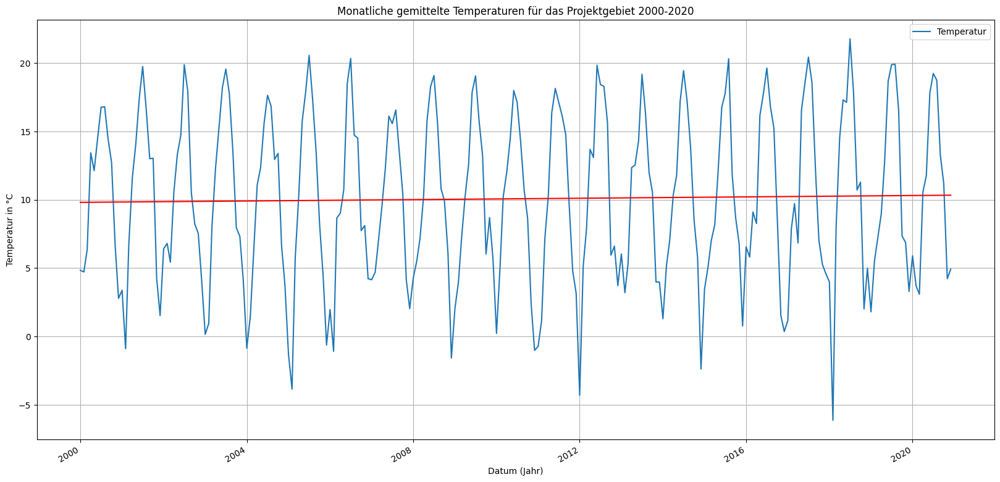

In [53]:
import matplotlib.pyplot as plt
import numpy as np

# Your existing code
plt.figure(figsize=(20, 10))  # Set the figure size (width, height) in inches
plt.plot(weather_data['Date'], weather_data['Temperature'], label='Temperatur', linestyle='-', marker=None)

plt.title('Monatliche gemittelte Temperaturen für das Projektgebiet 2000-2020')  # Set the title of the plot
plt.xlabel('Datum (Jahr)')  # Set the label for the x-axis
plt.ylabel('Temperatur in °C')  # Set the label for the y-axis
plt.legend()  # Show legend
plt.grid(True)  # Show grid lines

# Fit a linear trendline to the data
ordinal_dates = weather_data['Date'].map(lambda x: x.toordinal())
coefficients = np.polyfit(ordinal_dates, weather_data['Temperature'], 1)
trendline = np.poly1d(coefficients)

# Plot the trendline
plt.plot(weather_data['Date'], trendline(ordinal_dates), color='red', linestyle='-', label='Trendlinie')

# Optionally, format the x-axis with dates more nicely
plt.gcf().autofmt_xdate()  # Auto format the x-axis labels to fit better

plt.show()  # Display the plot


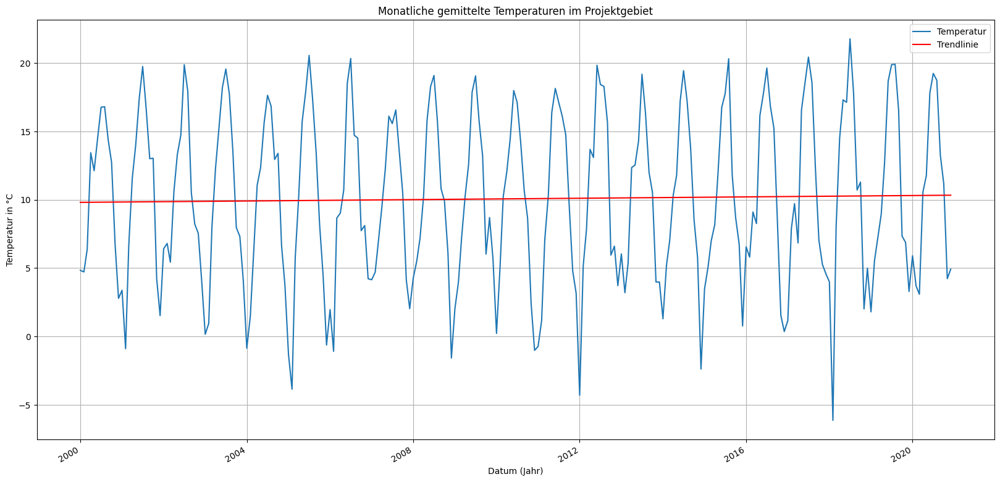

In [62]:
import numpy as np

# Convert dates to ordinal values
ordinal_dates = weather_data['Date'].map(lambda x: x.toordinal())

# Fit a linear trendline to the data
coefficients = np.polyfit(ordinal_dates, weather_data['Temperature'], 1)
trendline = np.poly1d(coefficients)

# Plot the data points
plt.figure(figsize=(20, 10))
plt.plot(weather_data['Date'], weather_data['Temperature'], label='Temperatur', linestyle='-', marker=None)

# Plot the trendline
plt.plot(weather_data['Date'], trendline(ordinal_dates), color='red', label='Trendlinie')

plt.title('Monatliche gemittelte Temperaturen im Projektgebiet')
plt.xlabel('Datum (Jahr)')
plt.ylabel('Temperatur in °C')
plt.legend()
plt.grid(True)

# Optionally, format the x-axis with dates more nicely
plt.gcf().autofmt_xdate()

plt.show()


In [58]:
import plotly.graph_objects as go

fig_temp = go.Figure()
fig_temp.add_trace(go.Scatter(x=weather_data['Date'], y=weather_data['Prec'], mode='lines', name='Temperature'))
fig_temp.update_layout(title='Niederschläge in Europa von 2000-2020', xaxis_title='Date', yaxis_title='Precipitation in mm', height=800)
fig_temp.show()
fig_temp.write_html("precipitation_2000_2020_analysis_over_time.html")


**Graph other than interactivity**

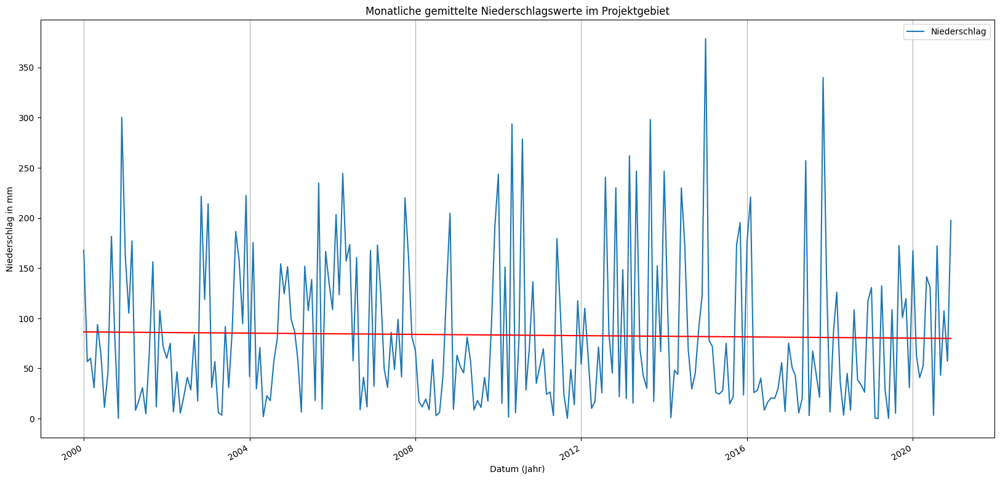

In [66]:
import matplotlib.pyplot as plt
import numpy as np

# Your existing code
plt.figure(figsize=(20, 10))  # Set the figure size (width, height) in inches
plt.plot(weather_data['Date'], weather_data['Prec'], label='Niederschlag', linestyle='-', marker=None)

plt.title('Monatliche gemittelte Niederschlagswerte im Projektgebiet')  # Set the title of the plot
plt.xlabel('Datum (Jahr)')  # Set the label for the x-axis
plt.ylabel('Niederschlag in mm')  # Set the label for the y-axis
plt.legend()  # Show legend
plt.grid(True, which='major', axis='x', linestyle='-')  # Add grid with a major grid line every year

# Fit a linear regression line to the data
x = np.arange(len(weather_data['Date']))
y = weather_data['Prec']
coefficients = np.polyfit(x, y, 1)
trend_line = np.poly1d(coefficients)


# Plot the trendline
plt.plot(weather_data['Date'], trendline(ordinal_dates), color='red', label='Trendlinie')

# Fit a linear trendline to the data
coefficients = np.polyfit(ordinal_dates, weather_data['Prec'], 1)
trendline = np.poly1d(coefficients)

# Optionally, format the x-axis with dates more nicely
plt.gcf().autofmt_xdate()  # Auto format the x-axis labels to fit better

plt.show()  # Display the plot


weather data relation

In [127]:
# Merging the DataFrames on the 'Date' column using an inner join

df = pd.DataFrame(monthly_class_counts).T
df.index = pd.to_datetime(df.index)
df.reset_index(inplace=True)
df.rename(columns={'index': 'Date'}, inplace=True)
merged_df = pd.merge(df, weather_data, on='Date', how='inner')


TypeError: Can only merge Series or DataFrame objects, a <class 'dict'> was passed

**ALL classes and temperature non interactive**

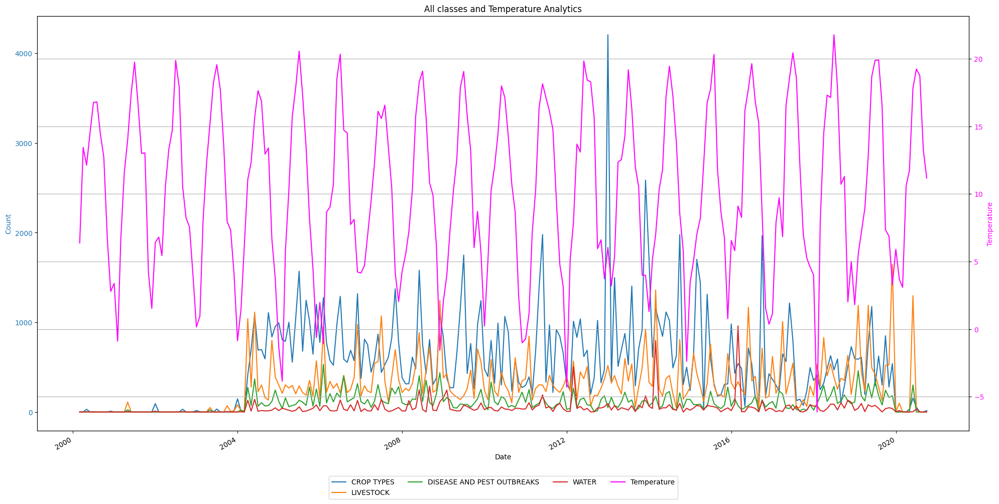

In [129]:


df_melted = merged_df.melt(id_vars='Date', var_name='Class', value_name='Count')


classes_to_plot = ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]

# Create the figure and the first axes (the primary y-axis)
fig, ax1 = plt.subplots(figsize=(20, 10))

# Plot each specified class on the primary y-axis
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    ax1.plot(group['Date'], group['Count'], label=class_name)

ax1.set_xlabel('Date')
ax1.set_ylabel('Count', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = ax1.twinx()
temperature_group = df_melted[df_melted['Class'] == 'Temperature']
# Use 'magenta' for a unique temperature color
ax2.plot(temperature_group['Date'], temperature_group['Count'], label='Temperature', color='magenta')
ax2.set_ylabel('Temperature', color='magenta')
ax2.tick_params(axis='y', labelcolor='magenta')

# Combined legend for both axes at the bottom
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

plt.title('All classes and Temperature Analytics')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gcf().autofmt_xdate()

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


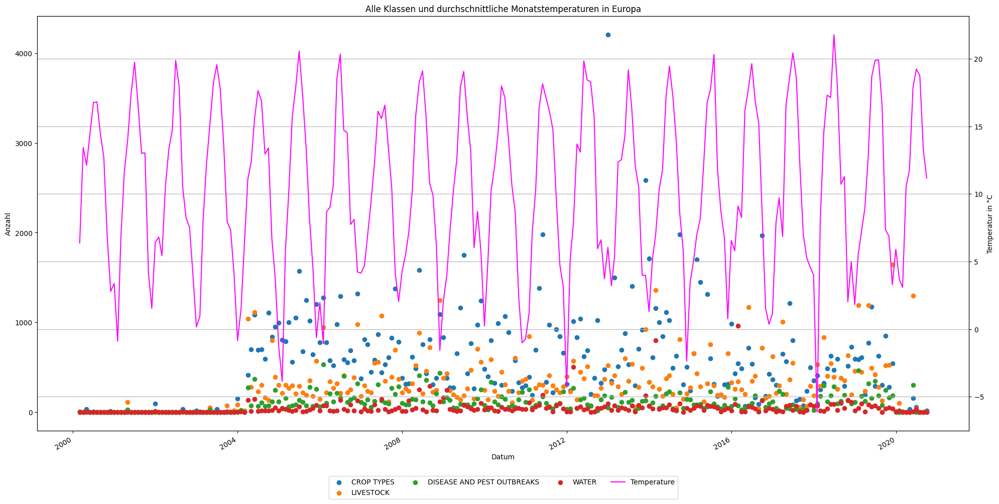

In [100]:
import matplotlib.pyplot as plt

# Assuming monthly_counts['year_month'] is your x-axis data
# Generate a list of labels, where every sixth month is labeled and others are empty strings
labels = [label if i % 6 == 0 else '' for i, label in enumerate(monthly_counts['year_month'])]

# Convert the 'Date' column to datetime if needed
df_melted['Date'] = pd.to_datetime(df_melted['Date'])

fig, ax1 = plt.subplots(figsize=(20, 10))

# Plot each specified class as a scatter plot on the primary y-axis with original colors
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    ax1.scatter(group['Date'], group['Count'], label=class_name)  # Use default scatter color

ax1.set_xlabel('Datum')
ax1.set_ylabel('Anzahl', color='black')  # Set y-axis label color to black
ax1.tick_params(axis='y', labelcolor='black')  # Set y-axis tick labels color to black

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = ax1.twinx()
temperature_group = df_melted[df_melted['Class'] == 'Temperature']
ax2.plot(temperature_group['Date'], temperature_group['Count'], label='Temperature', color='magenta')  # Set line color to black
ax2.set_ylabel('Temperatur in °C', color='black')  # Set y-axis label color to black
ax2.tick_params(axis='y', labelcolor='black')  # Set y-axis tick labels color to black

# Combined legend for both axes at the bottom
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

plt.title('Alle Klassen und durchschnittliche Monatstemperaturen in Europa')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gcf().autofmt_xdate()

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


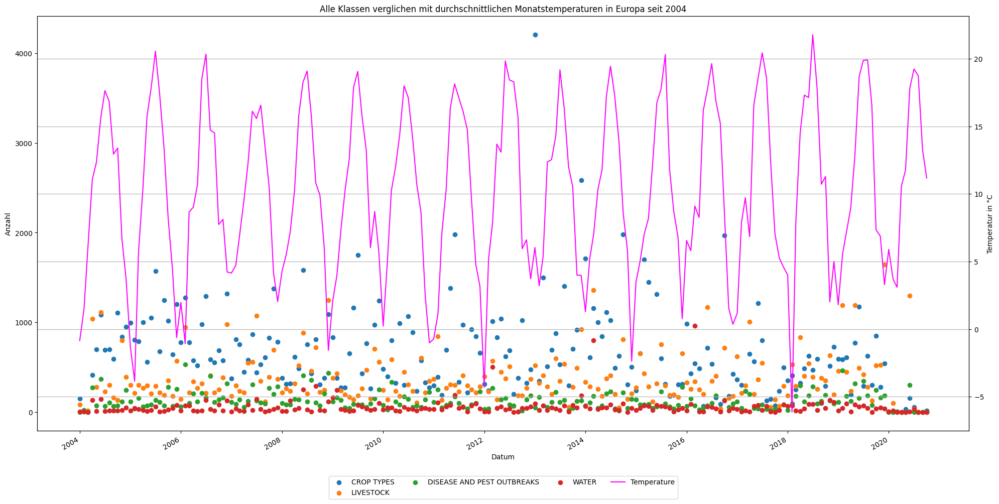

In [55]:
import matplotlib.pyplot as plt

# Filter the DataFrame to include only data from 2004 onwards
df_melted_filtered = df_melted[df_melted['Date'] >= '2004-01-01']

# Assuming monthly_counts['year_month'] is your x-axis data
# Generate a list of labels, where every sixth month is labeled and others are empty strings
labels = [label if i % 6 == 0 else '' for i, label in enumerate(monthly_counts['year_month'])]

fig, ax1 = plt.subplots(figsize=(20, 10))

# Plot each specified class as a scatter plot on the primary y-axis with original colors
for class_name in classes_to_plot:
    group = df_melted_filtered[df_melted_filtered['Class'] == class_name]
    ax1.scatter(group['Date'], group['Count'], label=class_name)  # Use default scatter color

ax1.set_xlabel('Datum')
ax1.set_ylabel('Anzahl', color='black')  # Set y-axis label color to black
ax1.tick_params(axis='y', labelcolor='black')  # Set y-axis tick labels color to black

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = ax1.twinx()
temperature_group = df_melted_filtered[df_melted_filtered['Class'] == 'Temperature']
ax2.plot(temperature_group['Date'], temperature_group['Count'], label='Temperature', color='magenta')  # Set line color to black
ax2.set_ylabel('Temperatur in °C', color='black')  # Set y-axis label color to black
ax2.tick_params(axis='y', labelcolor='black')  # Set y-axis tick labels color to black

# Combined legend for both axes at the bottom
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

plt.title('Alle Klassen verglichen mit durchschnittlichen Monatstemperaturen in Europa seit 2004')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gcf().autofmt_xdate()

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


**ALL classes and precipitation non interactive**

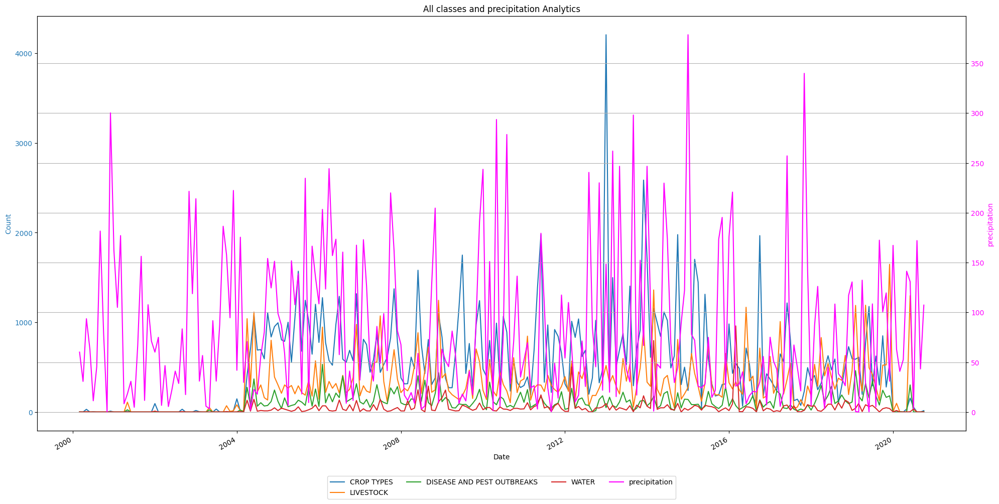

In [56]:


df_melted = merged_df.melt(id_vars='Date', var_name='Class', value_name='Count')




classes_to_plot = ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]

# Create the figure and the first axes (the primary y-axis)
fig, ax1 = plt.subplots(figsize=(20, 10))

# Plot each specified class on the primary y-axis
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    ax1.plot(group['Date'], group['Count'], label=class_name)

ax1.set_xlabel('Date')
ax1.set_ylabel('Count', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = ax1.twinx()
temperature_group = df_melted[df_melted['Class'] == 'Prec']

ax2.plot(temperature_group['Date'], temperature_group['Count'], label='precipitation', color='magenta')
ax2.set_ylabel('precipitation', color='magenta')
ax2.tick_params(axis='y', labelcolor='magenta')

# Combined legend for both axes at the bottom
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

plt.title('All classes and precipitation Analytics')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gcf().autofmt_xdate()

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


Seperate Graphs for each Class with temperature and preceptiation

**CROP TYPES temperature non interactive**

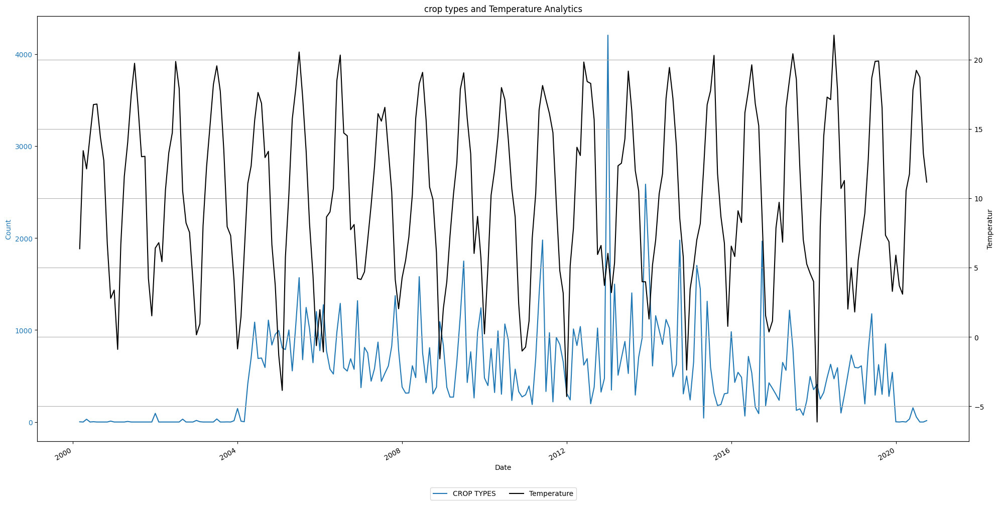

In [62]:


df_melted = merged_df.melt(id_vars='Date', var_name='Class', value_name='Count')




classes_to_plot = ["CROP TYPES"]

# Create the figure and the first axes (the primary y-axis)
fig, ax1 = plt.subplots(figsize=(20, 10))

# Plot each specified class on the primary y-axis
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    ax1.plot(group['Date'], group['Count'], label=class_name)

ax1.set_xlabel('Date')
ax1.set_ylabel('Count', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = ax1.twinx()
temperature_group = df_melted[df_melted['Class'] == 'Temperature']
# Use 'magenta' for a unique temperature color
ax2.plot(temperature_group['Date'], temperature_group['Count'], label='Temperature', color='black')
ax2.set_ylabel('Temperatur', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Combined legend for both axes at the bottom
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

plt.title('crop types and Temperature Analytics')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gcf().autofmt_xdate()

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


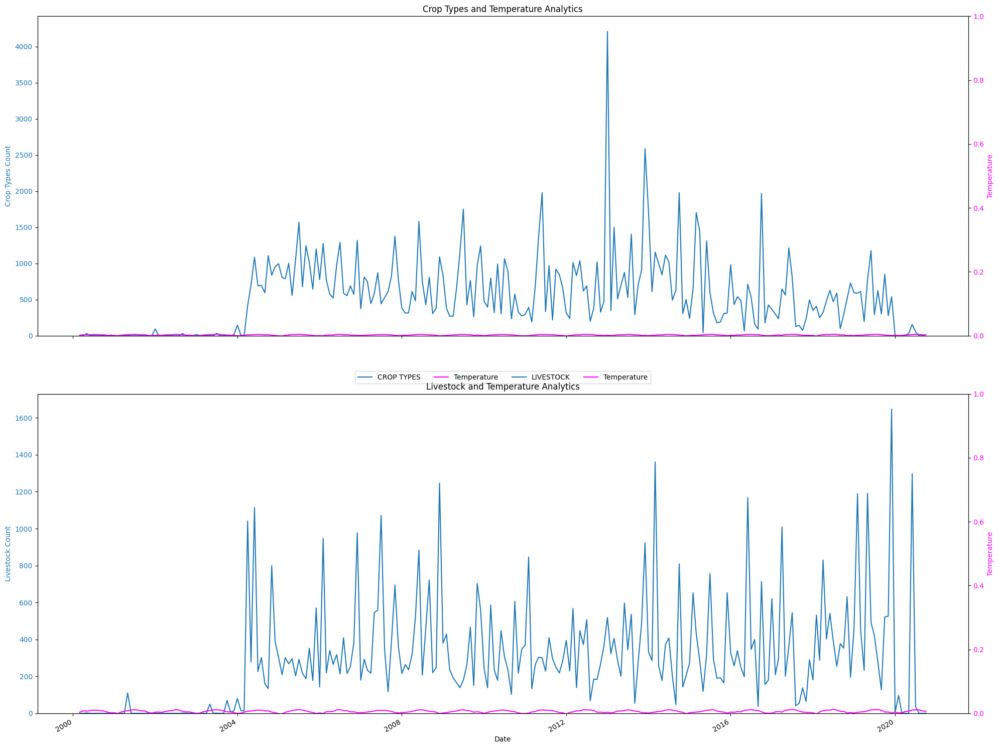

In [89]:
import matplotlib.pyplot as plt

# Define the classes to plot
classes_to_plot_crop = ["CROP TYPES"]
classes_to_plot_livestock = ["LIVESTOCK"]

# Create the figure and subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 15), sharex=True)

# Plot crop types and temperature on the first subplot
for class_name in classes_to_plot_crop:
    group = df_melted[df_melted['Class'] == class_name]
    ax1.plot(group['Date'], group['Count'], label=class_name)

ax1.set_ylabel('Crop Types Count', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

temperature_group_crop = df_melted[df_melted['Class'] == 'Temperature']
ax1.plot(temperature_group_crop['Date'], temperature_group_crop['Count'], label='Temperature', color='magenta')
ax1.set_ylim(bottom=0)  # Ensure y-axis starts from 0 for both plots

# Create the second y-axis for temperature on the first subplot
ax1_twin = ax1.twinx()
ax1_twin.set_ylabel('Temperature', color='magenta')
ax1_twin.tick_params(axis='y', labelcolor='magenta')


# Plot livestock and temperature on the second subplot
for class_name in classes_to_plot_livestock:
    group = df_melted[df_melted['Class'] == class_name]
    ax2.plot(group['Date'], group['Count'], label=class_name)

ax2.set_xlabel('Date')
ax2.set_ylabel('Livestock Count', color='tab:blue')
ax2.tick_params(axis='y', labelcolor='tab:blue')

temperature_group_livestock = df_melted[df_melted['Class'] == 'Temperature']
ax2.plot(temperature_group_livestock['Date'], temperature_group_livestock['Count'], label='Temperature', color='magenta')
ax2.set_ylim(bottom=0)  # Ensure y-axis starts from 0 for both plots

# Create the second y-axis for temperature on the second subplot
ax2_twin = ax2.twinx()
ax2_twin.set_ylabel('Temperature', color='magenta')
ax2_twin.tick_params(axis='y', labelcolor='magenta')
# Do not set the bottom limit explicitly, let it adjust dynamically


# Combined legend for both subplots
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

# Set titles for both subplots
ax1.set_title('Crop Types and Temperature Analytics')
ax2.set_title('Livestock and Temperature Analytics')

# Improve date formatting on the x-axis
fig.autofmt_xdate()

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


**CROP TYPES and precipitation non interactive**

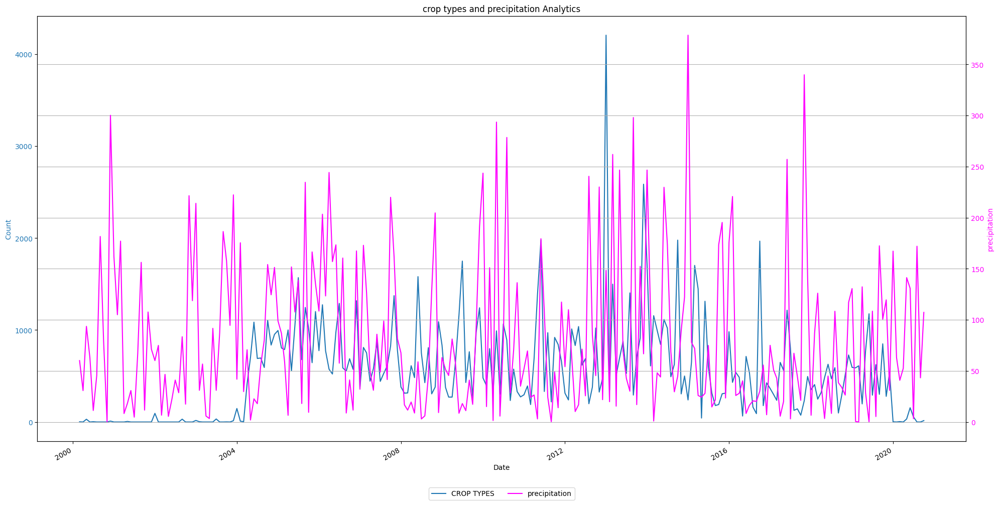

In [95]:


df_melted = merged_df.melt(id_vars='Date', var_name='Class', value_name='Count')




classes_to_plot = ["CROP TYPES"]

# Create the figure and the first axes (the primary y-axis)
fig, ax1 = plt.subplots(figsize=(20, 10))

# Plot each specified class on the primary y-axis
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    ax1.plot(group['Date'], group['Count'], label=class_name)

ax1.set_xlabel('Date')
ax1.set_ylabel('Count', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = ax1.twinx()
temperature_group = df_melted[df_melted['Class'] == 'Prec']

ax2.plot(temperature_group['Date'], temperature_group['Count'], label='precipitation', color='magenta')
ax2.set_ylabel('precipitation', color='magenta')
ax2.tick_params(axis='y', labelcolor='magenta')

# Combined legend for both axes at the bottom
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

plt.title('crop types and precipitation Analytics')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gcf().autofmt_xdate()

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


**LIVESTOCK temperature non interactive**

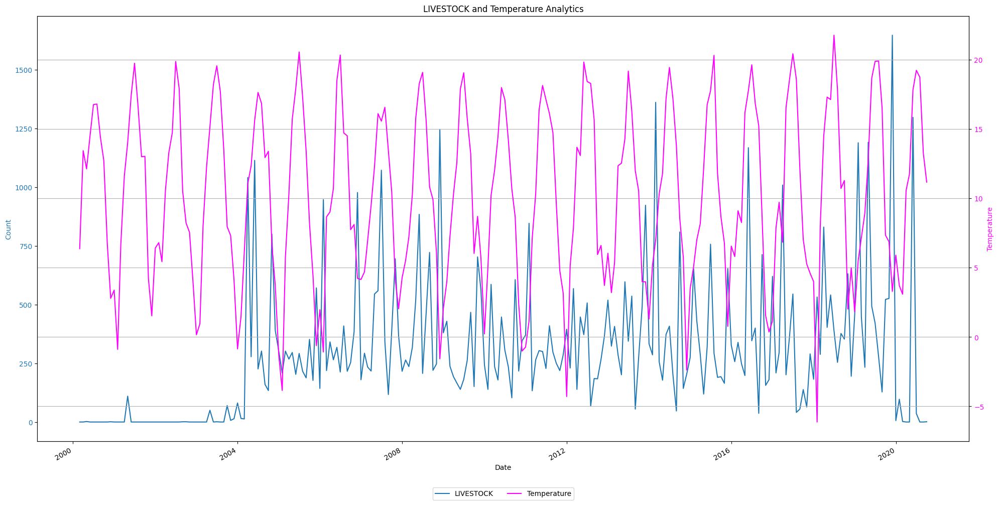

In [96]:


df_melted = merged_df.melt(id_vars='Date', var_name='Class', value_name='Count')




classes_to_plot = ["LIVESTOCK"]

# Create the figure and the first axes (the primary y-axis)
fig, ax1 = plt.subplots(figsize=(20, 10))

# Plot each specified class on the primary y-axis
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    ax1.plot(group['Date'], group['Count'], label=class_name)

ax1.set_xlabel('Date')
ax1.set_ylabel('Count', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = ax1.twinx()
temperature_group = df_melted[df_melted['Class'] == 'Temperature']
# Use 'magenta' for a unique temperature color
ax2.plot(temperature_group['Date'], temperature_group['Count'], label='Temperature', color='magenta')
ax2.set_ylabel('Temperature', color='magenta')
ax2.tick_params(axis='y', labelcolor='magenta')

# Combined legend for both axes at the bottom
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

plt.title('LIVESTOCK and Temperature Analytics')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gcf().autofmt_xdate()

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


**LIVESTOCK and precipitation non interactive**

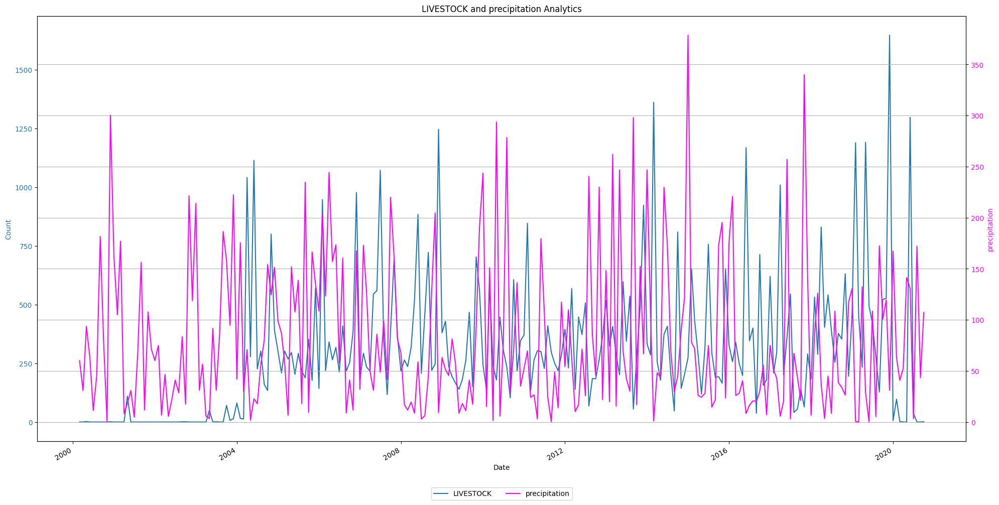

In [97]:


df_melted = merged_df.melt(id_vars='Date', var_name='Class', value_name='Count')



classes_to_plot = ["LIVESTOCK"]

# Create the figure and the first axes (the primary y-axis)
fig, ax1 = plt.subplots(figsize=(20, 10))

# Plot each specified class on the primary y-axis
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    ax1.plot(group['Date'], group['Count'], label=class_name)

ax1.set_xlabel('Date')
ax1.set_ylabel('Count', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = ax1.twinx()
temperature_group = df_melted[df_melted['Class'] == 'Prec']

ax2.plot(temperature_group['Date'], temperature_group['Count'], label='precipitation', color='magenta')
ax2.set_ylabel('precipitation', color='magenta')
ax2.tick_params(axis='y', labelcolor='magenta')

# Combined legend for both axes at the bottom
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

plt.title('LIVESTOCK and precipitation Analytics')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gcf().autofmt_xdate()

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


**DISEASE AND PEST OUTBREAKS temperature non interactive**

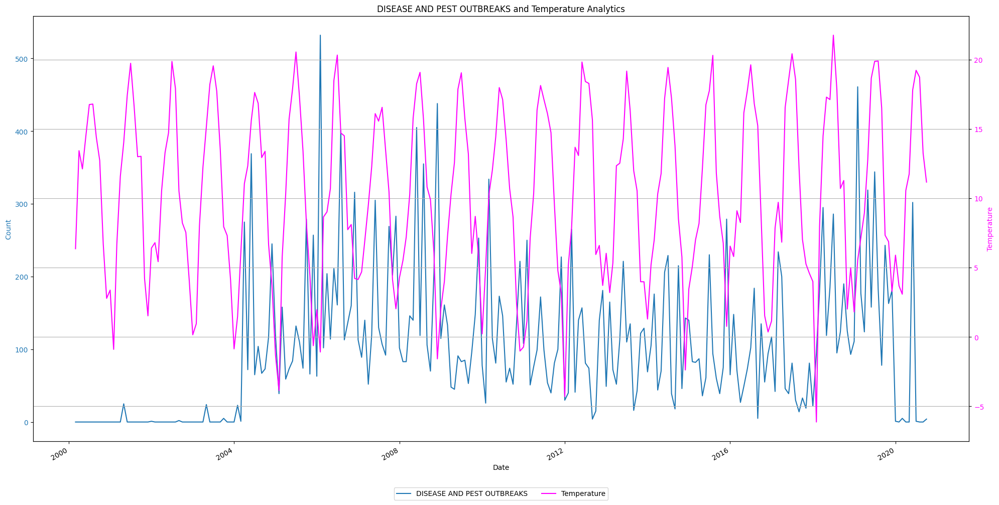

In [98]:


df_melted = merged_df.melt(id_vars='Date', var_name='Class', value_name='Count')





classes_to_plot = ["DISEASE AND PEST OUTBREAKS"]

# Create the figure and the first axes (the primary y-axis)
fig, ax1 = plt.subplots(figsize=(20, 10))

# Plot each specified class on the primary y-axis
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    ax1.plot(group['Date'], group['Count'], label=class_name)

ax1.set_xlabel('Date')
ax1.set_ylabel('Count', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = ax1.twinx()
temperature_group = df_melted[df_melted['Class'] == 'Temperature']
# Use 'magenta' for a unique temperature color
ax2.plot(temperature_group['Date'], temperature_group['Count'], label='Temperature', color='magenta')
ax2.set_ylabel('Temperature', color='magenta')
ax2.tick_params(axis='y', labelcolor='magenta')

# Combined legend for both axes at the bottom
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

plt.title('DISEASE AND PEST OUTBREAKS and Temperature Analytics')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gcf().autofmt_xdate()

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


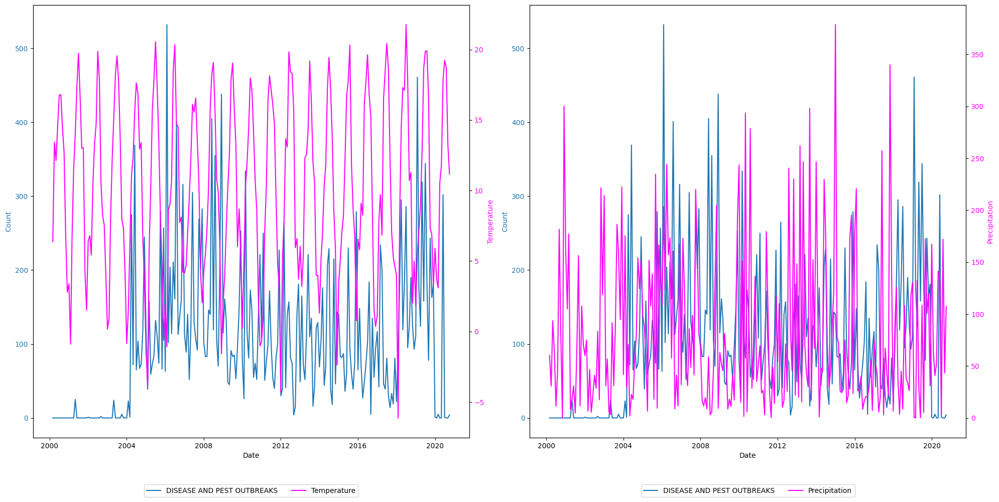

In [99]:
import matplotlib.pyplot as plt

# Plot 1: Disease and Pest Outbreaks vs Temperature
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Plot 1: Disease and Pest Outbreaks vs Temperature
# Plot Disease and Pest Outbreaks on the first subplot (left plot)
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    axs[0].plot(group['Date'], group['Count'], label=class_name, color='tab:blue')

axs[0].set_xlabel('Date')
axs[0].set_ylabel('Count', color='tab:blue')
axs[0].tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = axs[0].twinx()
temperature_group = df_melted[df_melted['Class'] == 'Temperature']
# Use 'magenta' for a unique temperature color
ax2.plot(temperature_group['Date'], temperature_group['Count'], label='Temperature', color='magenta')
ax2.set_ylabel('Temperature', color='magenta')
ax2.tick_params(axis='y', labelcolor='magenta')

# Plot 2: Disease and Pest Outbreaks vs Precipitation
# Plot Disease and Pest Outbreaks on the second subplot (right plot)
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    axs[1].plot(group['Date'], group['Count'], label=class_name, color='tab:blue')

axs[1].set_xlabel('Date')
axs[1].set_ylabel('Count', color='tab:blue')
axs[1].tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax3 = axs[1].twinx()
precipitation_group = df_melted[df_melted['Class'] == 'Prec']
ax3.plot(precipitation_group['Date'], precipitation_group['Count'], label='Precipitation', color='magenta')
ax3.set_ylabel('Precipitation', color='magenta')
ax3.tick_params(axis='y', labelcolor='magenta')

# Combined legend for both axes at the bottom
lines1, labels1 = axs[0].get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
axs[0].legend(lines1 + lines2, labels1 + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

lines3, labels3 = axs[1].get_legend_handles_labels()
lines4, labels4 = ax3.get_legend_handles_labels()
axs[1].legend(lines3 + lines4, labels3 + labels4, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


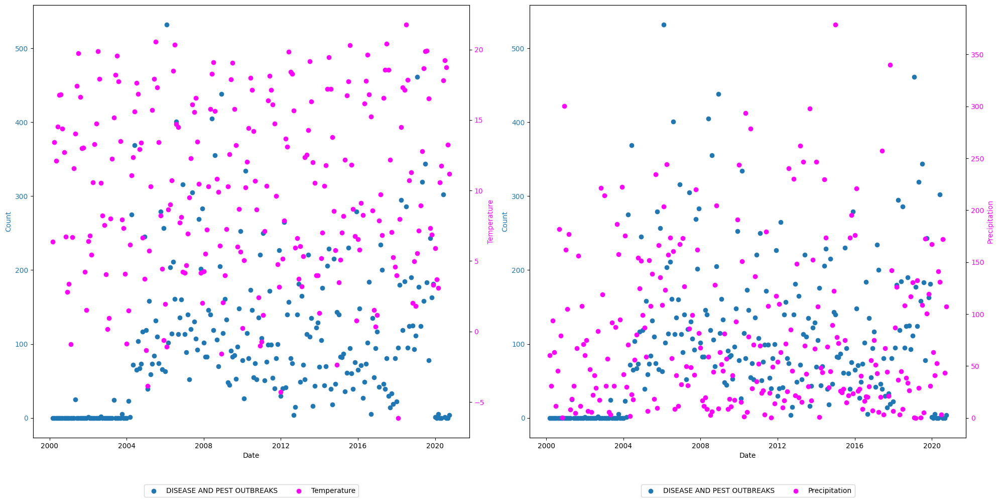

In [100]:
import matplotlib.pyplot as plt

# Plot 1: Disease and Pest Outbreaks vs Temperature
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Plot 1: Disease and Pest Outbreaks vs Temperature
# Plot Disease and Pest Outbreaks on the first subplot (left plot)
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    axs[0].scatter(group['Date'], group['Count'], label=class_name, color='tab:blue')

axs[0].set_xlabel('Date')
axs[0].set_ylabel('Count', color='tab:blue')
axs[0].tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = axs[0].twinx()
temperature_group = df_melted[df_melted['Class'] == 'Temperature']
# Use 'magenta' for a unique temperature color
ax2.scatter(temperature_group['Date'], temperature_group['Count'], label='Temperature', color='magenta')
ax2.set_ylabel('Temperature', color='magenta')
ax2.tick_params(axis='y', labelcolor='magenta')

# Plot 2: Disease and Pest Outbreaks vs Precipitation
# Plot Disease and Pest Outbreaks on the second subplot (right plot)
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    axs[1].scatter(group['Date'], group['Count'], label=class_name, color='tab:blue')

axs[1].set_xlabel('Date')
axs[1].set_ylabel('Count', color='tab:blue')
axs[1].tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax3 = axs[1].twinx()
precipitation_group = df_melted[df_melted['Class'] == 'Prec']
ax3.scatter(precipitation_group['Date'], precipitation_group['Count'], label='Precipitation', color='magenta')
ax3.set_ylabel('Precipitation', color='magenta')
ax3.tick_params(axis='y', labelcolor='magenta')

# Combined legend for both axes at the bottom
lines1, labels1 = axs[0].get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
axs[0].legend(lines1 + lines2, labels1 + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

lines3, labels3 = axs[1].get_legend_handles_labels()
lines4, labels4 = ax3.get_legend_handles_labels()
axs[1].legend(lines3 + lines4, labels3 + labels4, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


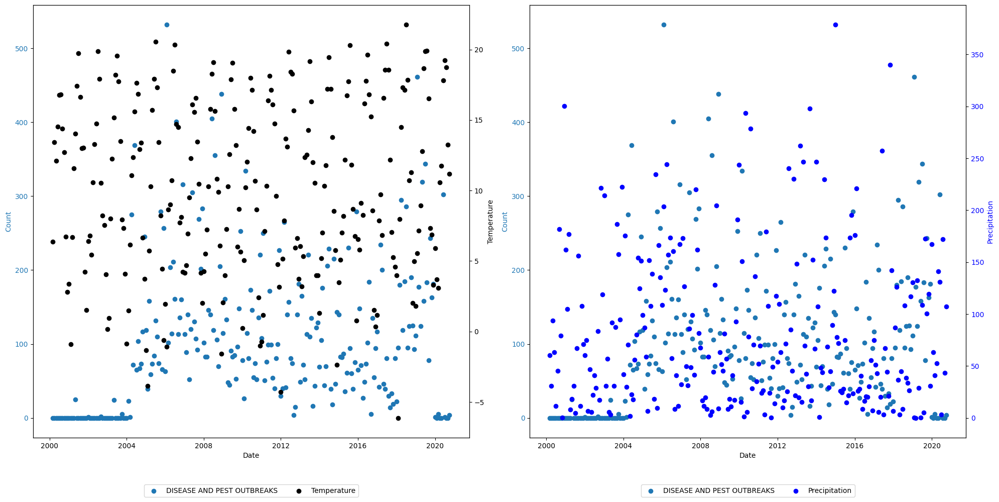

In [101]:
import matplotlib.pyplot as plt

# Plot 1: Disease and Pest Outbreaks vs Temperature
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Plot 1: Disease and Pest Outbreaks vs Temperature
# Plot Disease and Pest Outbreaks on the first subplot (left plot)
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    axs[0].scatter(group['Date'], group['Count'], label=class_name, color='tab:blue')

axs[0].set_xlabel('Date')
axs[0].set_ylabel('Count', color='tab:blue')
axs[0].tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = axs[0].twinx()
temperature_group = df_melted[df_melted['Class'] == 'Temperature']
# Use 'black' color for the temperature data
ax2.scatter(temperature_group['Date'], temperature_group['Count'], label='Temperature', color='black')
ax2.set_ylabel('Temperature', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Plot 2: Disease and Pest Outbreaks vs Precipitation
# Plot Disease and Pest Outbreaks on the second subplot (right plot)
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    axs[1].scatter(group['Date'], group['Count'], label=class_name, color='tab:blue')

axs[1].set_xlabel('Date')
axs[1].set_ylabel('Count', color='tab:blue')
axs[1].tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax3 = axs[1].twinx()
precipitation_group = df_melted[df_melted['Class'] == 'Prec']
ax3.scatter(precipitation_group['Date'], precipitation_group['Count'], label='Precipitation', color='blue')
ax3.set_ylabel('Precipitation', color='blue')
ax3.tick_params(axis='y', labelcolor='blue')

# Combined legend for both axes at the bottom
lines1, labels1 = axs[0].get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
axs[0].legend(lines1 + lines2, labels1 + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

lines3, labels3 = axs[1].get_legend_handles_labels()
lines4, labels4 = ax3.get_legend_handles_labels()
axs[1].legend(lines3 + lines4, labels3 + labels4, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


**DISEASE AND PEST OUTBREAKS and precipitation non interactive**

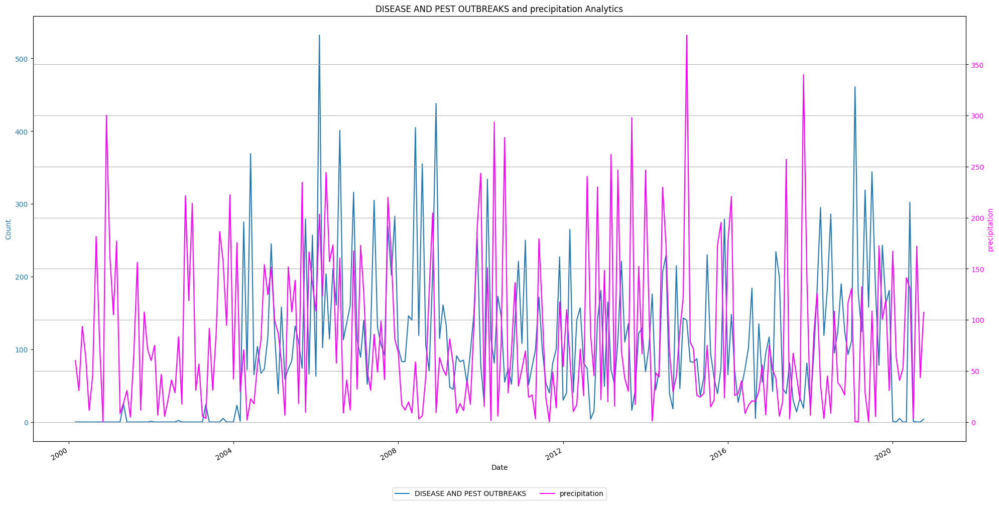

In [102]:


df_melted = merged_df.melt(id_vars='Date', var_name='Class', value_name='Count')




classes_to_plot = ["DISEASE AND PEST OUTBREAKS"]

# Create the figure and the first axes (the primary y-axis)
fig, ax1 = plt.subplots(figsize=(20, 10))

# Plot each specified class on the primary y-axis
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    ax1.plot(group['Date'], group['Count'], label=class_name)

ax1.set_xlabel('Date')
ax1.set_ylabel('Count', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = ax1.twinx()
temperature_group = df_melted[df_melted['Class'] == 'Prec']

ax2.plot(temperature_group['Date'], temperature_group['Count'], label='precipitation', color='magenta')
ax2.set_ylabel('precipitation', color='magenta')
ax2.tick_params(axis='y', labelcolor='magenta')

# Combined legend for both axes at the bottom
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

plt.title('DISEASE AND PEST OUTBREAKS and precipitation Analytics')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gcf().autofmt_xdate()

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


**WATER temperature non interactive**

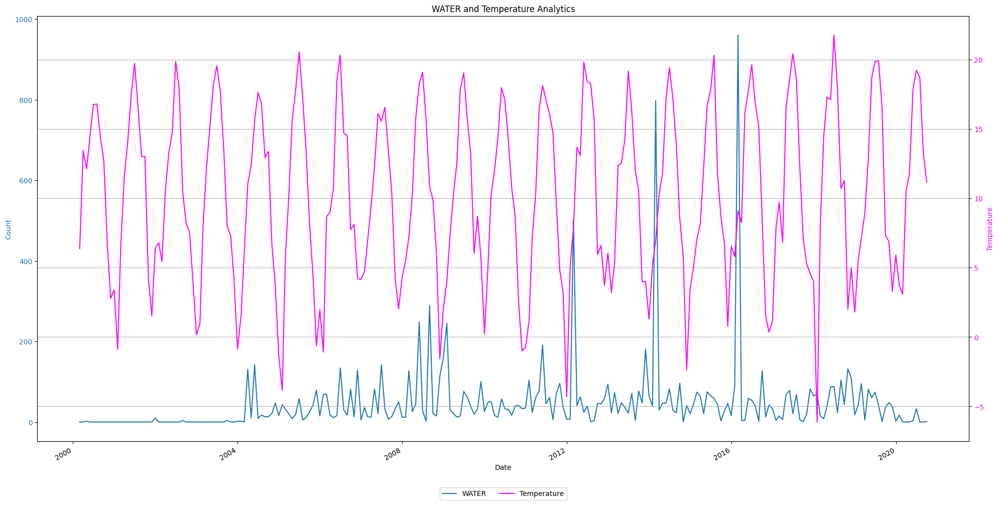

In [103]:


df_melted = merged_df.melt(id_vars='Date', var_name='Class', value_name='Count')




classes_to_plot = ["WATER"]

# Create the figure and the first axes (the primary y-axis)
fig, ax1 = plt.subplots(figsize=(20, 10))

# Plot each specified class on the primary y-axis
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    ax1.plot(group['Date'], group['Count'], label=class_name)

ax1.set_xlabel('Date')
ax1.set_ylabel('Count', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = ax1.twinx()
temperature_group = df_melted[df_melted['Class'] == 'Temperature']
# Use 'magenta' for a unique temperature color
ax2.plot(temperature_group['Date'], temperature_group['Count'], label='Temperature', color='magenta')
ax2.set_ylabel('Temperature', color='magenta')
ax2.tick_params(axis='y', labelcolor='magenta')

# Combined legend for both axes at the bottom
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

plt.title('WATER and Temperature Analytics')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gcf().autofmt_xdate()

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


**WATER and precipitation non interactive**

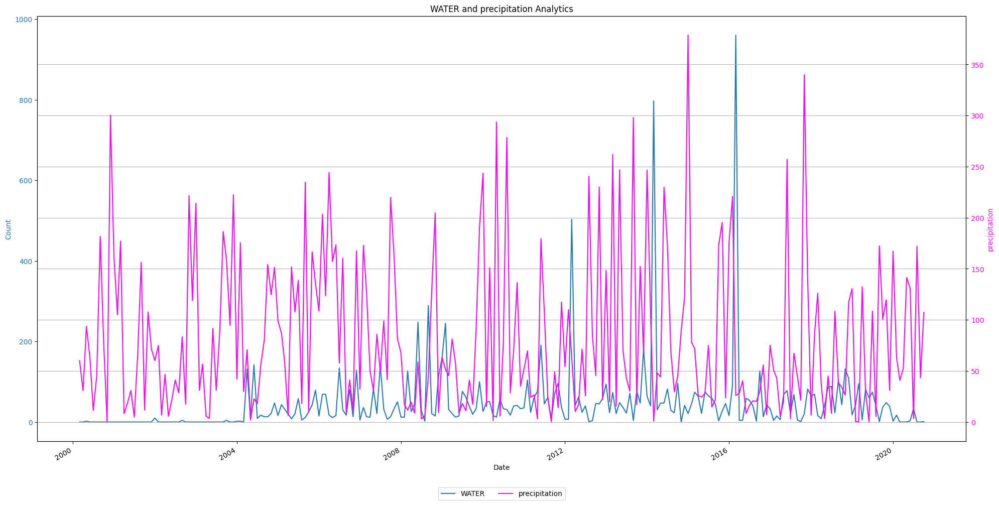

In [126]:


df_melted = merged_df.melt(id_vars='Date', var_name='Class', value_name='Count')




classes_to_plot = ["WATER"]

# Create the figure and the first axes (the primary y-axis)
fig, ax1 = plt.subplots(figsize=(20, 10))

# Plot each specified class on the primary y-axis
for class_name in classes_to_plot:
    group = df_melted[df_melted['Class'] == class_name]
    ax1.plot(group['Date'], group['Count'], label=class_name)

ax1.set_xlabel('Date')
ax1.set_ylabel('Count', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = ax1.twinx()
temperature_group = df_melted[df_melted['Class'] == 'Prec']

ax2.plot(temperature_group['Date'], temperature_group['Count'], label='precipitation', color='magenta')
ax2.set_ylabel('precipitation', color='magenta')
ax2.tick_params(axis='y', labelcolor='magenta')

# Combined legend for both axes at the bottom
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4)

plt.title('WATER and precipitation Analytics')
plt.grid(True)

# Improve date formatting on the x-axis
plt.gcf().autofmt_xdate()

plt.tight_layout()  # Adjust layout to make room for the legend below the plot
plt.show()


In [125]:

# ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]
# Filter the dataframe for the two classes you are interested in
filtered_df = df_melted[df_melted['Class'].isin(['CROP TYPES', 'Temperature'])]

# Create the line plot
fig = px.line(filtered_df, x='Date', y='Count', color='Class', markers=True,
              title='CROP TYPE vs Temperature Analytics',
              labels={'Date': '', 'Count': 'Count'})

# Update layout for hover information and legend
fig.update_layout(
    hovermode='x unified',
    legend_title_text='Class',
    legend=dict(orientation="h", yanchor="bottom", y=-0.3, xanchor="center", x=0.5),
    height=800,
    width=1600
)

# Show the plot
fig.show()
fig.write_html("CROP TYPE vs Temperature Analytics.html")

In [106]:
# ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]
# Filter the dataframe for the two classes you are interested in
filtered_df = df_melted[df_melted['Class'].isin(['CROP TYPES', 'Prec'])]

# Create the line plot
fig = px.line(filtered_df, x='Date', y='Count', color='Class', markers=True,
              title='CROP TYPE vs Preceptitation Analytics',
              labels={'Date': '', 'Count': 'Count'})

# Update layout for hover information and legend
fig.update_layout(
    hovermode='x unified',
    legend_title_text='Class',
    legend=dict(orientation="h", yanchor="bottom", y=-0.3, xanchor="center", x=0.5),
    height=800,
    width=1600
)

# Show the plot
fig.show()
fig.write_html("CROP TYPE vs Preceptitation Analytics.html")

In [107]:
# ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]
# Filter the dataframe for the two classes you are interested in
filtered_df = df_melted[df_melted['Class'].isin(['LIVESTOCK', 'Temperature'])]

# Create the line plot
fig = px.line(filtered_df, x='Date', y='Count', color='Class', markers=True,
              title='LIVESTOCK vs Temperature Analytics',
              labels={'Date': '', 'Count': 'Count'})

# Update layout for hover information and legend
fig.update_layout(
    hovermode='x unified',
    legend_title_text='Class',
    legend=dict(orientation="h", yanchor="bottom", y=-0.3, xanchor="center", x=0.5),
    height=800,
    width=1600
)

# Show the plot
fig.show()
fig.write_html("LIVESTOCK vs Temperature Analytics.html")

In [124]:
# ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]
# Filter the dataframe for the two classes you are interested in
filtered_df = df_melted[df_melted['Class'].isin(['LIVESTOCK', 'Prec'])]

# Create the line plot
fig = px.line(filtered_df, x='Date', y='Count', color='Class', markers=True,
              title='LIVESTOCK vs Preceptitation Analytics',
              labels={'Date': '', 'Count': 'Count'})

# Update layout for hover information and legend
fig.update_layout(
    hovermode='x unified',
    legend_title_text='Class',
    legend=dict(orientation="h", yanchor="bottom", y=-0.3, xanchor="center", x=0.5),
    height=800,
    width=1600
)

# Show the plot
fig.show()
fig.write_html("LIVESTOCK und Niederschlag.html")

In [122]:
# ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]
# Filter the dataframe for the two classes you are interested in
filtered_df = df_melted[df_melted['Class'].isin(['WATER', 'Temperature'])]

# Create the line plot
fig = px.line(filtered_df, x='Date', y='Count', color='Class', markers=True,
              title='WATER vs Temperature Analytics',
              labels={'Date': '', 'Count': 'Count'})

# Update layout for hover information and legend
fig.update_layout(
    hovermode='x unified',
    legend_title_text='Class',
    legend=dict(orientation="h", yanchor="bottom", y=-0.3, xanchor="center", x=0.5),
    height=800,
    width=1600
)

# Show the plot
fig.show()
fig.write_html("WATER und Temperatur.html")

In [121]:
# ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]
# Filter the dataframe for the two classes you are interested in
filtered_df = df_melted[df_melted['Class'].isin(['WATER', 'Prec'])]

# Create the line plot
fig = px.line(filtered_df, x='Date', y='Count', color='Class', markers=True,
              title='WATER vs Preceptitation Analytics',
              labels={'Date': '', 'Count': 'Count'})

# Update layout for hover information and legend
fig.update_layout(
    hovermode='x unified',
    legend_title_text='Class',
    legend=dict(orientation="h", yanchor="bottom", y=-0.3, xanchor="center", x=0.5),
    height=800,
    width=1600
)

# Show the plot
fig.show()
fig.write_html("WATER und Niederschlag.html")

In [111]:
# ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]
# Filter the dataframe for the two classes you are interested in
filtered_df = df_melted[df_melted['Class'].isin(['DISEASE AND PEST OUTBREAKS', 'Temperature'])]

# Create the line plot
fig = px.line(filtered_df, x='Date', y='Count', color='Class', markers=True,
              title='DISEASE AND PEST OUTBREAKS vs Temperature Analytics',
              labels={'Date': '', 'Count': 'Count'})

# Update layout for hover information and legend
fig.update_layout(
    hovermode='x unified',
    legend_title_text='Class',
    legend=dict(orientation="h", yanchor="bottom", y=-0.3, xanchor="center", x=0.5),
    height=800,
    width=1600
)

# Show the plot
fig.show()
fig.write_html("DISEASE AND PEST OUTBREAKS vs Temperature Analytics.html")

In [120]:
# ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]
# Filter the dataframe for the two classes you are interested in
filtered_df = df_melted[df_melted['Class'].isin(['DISEASE AND PEST OUTBREAKS', 'Prec'])]

# Create the line plot
fig = px.line(filtered_df, x='Date', y='Count', color='Class', markers=True,
              title='DISEASE AND PEST OUTBREAKS vs Preceptitation Analytics',
              labels={'Date': '', 'Count': 'Count'})

# Update layout for hover information and legend
fig.update_layout(
    hovermode='x unified',
    legend_title_text='Class',
    legend=dict(orientation="h", yanchor="bottom", y=-0.3, xanchor="center", x=0.5),
    height=800,
    width=1600
)

# Show the plot
fig.show()
fig.write_html("DISEASE AND PEST OUTBREAKS und Niederschläge.html")


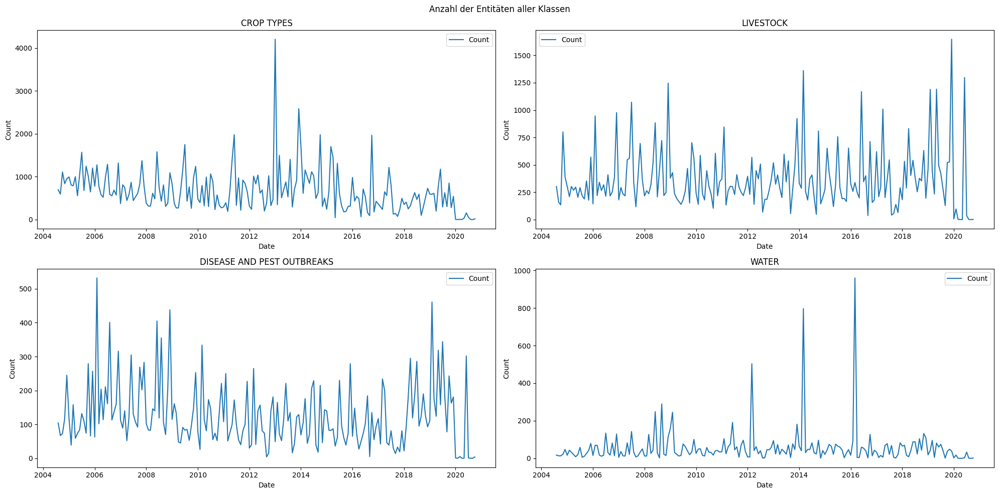

In [119]:
import matplotlib.pyplot as plt
import numpy as np
import math

# Sample data (replace this with your actual data)
classes_to_plot = ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]
num_classes = len(classes_to_plot)

# Filter data to start from August 2004
df_melted_filtered = df_melted[df_melted['Date'] >= '2004-08-01']

# Create the figure and subplots
plt.figure(figsize=(20, 10))
for i, class_name in enumerate(classes_to_plot, start=1):
    plt.subplot(2, 2, i)
    group = df_melted_filtered[df_melted_filtered['Class'] == class_name]
    plt.plot(group['Date'], group['Count'], label='Count')
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.title(class_name)
    plt.legend()

plt.suptitle('Anzahl der Entitäten aller Klassen')
plt.tight_layout()
plt.show()


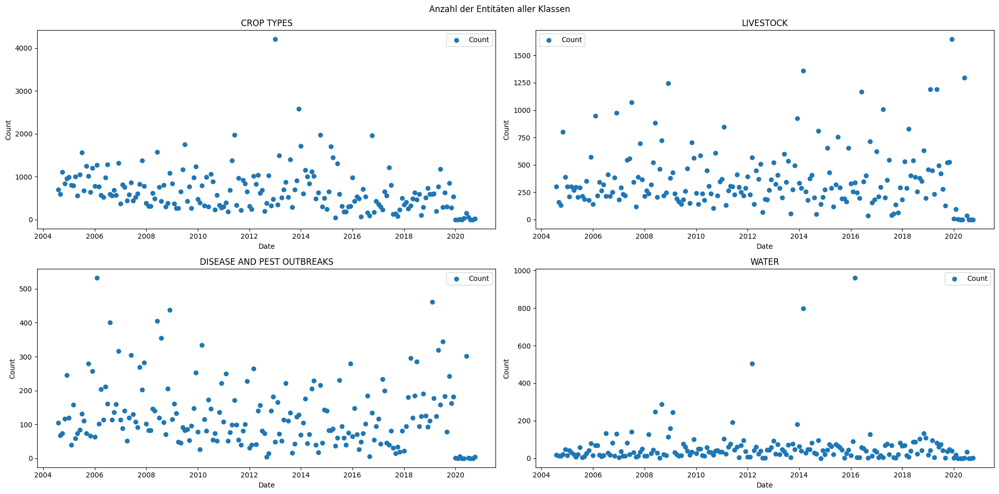

In [117]:
import matplotlib.pyplot as plt
import numpy as np
import math


classes_to_plot = ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]
num_classes = len(classes_to_plot)

# Filter data to start from August 2004
df_melted_filtered = df_melted[df_melted['Date'] >= '2004-08-01']

# Create the figure and subplots
plt.figure(figsize=(20, 10))
for i, class_name in enumerate(classes_to_plot, start=1):
    plt.subplot(2, 2, i)
    group = df_melted_filtered[df_melted_filtered['Class'] == class_name]
    plt.scatter(group['Date'], group['Count'], label='Count')
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.title(class_name)
    plt.legend()

plt.suptitle('Anzahl der Entitäten aller Klassen')
plt.tight_layout()
plt.show()

ax1.plot(group['Date'], group['Count'], label=class_name)

ax1.set_xlabel('Date')
ax1.set_ylabel('Count', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create the second axes (the secondary y-axis) sharing the same x-axis
ax2 = ax1.twinx()
temperature_group = df_melted[df_melted['Class'] == 'Temperature']
# Use 'magenta' for a unique temperature color
ax2.plot(temperature_group['Date'], temperature_group['Count'], label='Temperature', color='magenta')
ax2.set_ylabel('Temperature', color='magenta')
ax2.tick_params(axis='y', labelcolor='magenta')


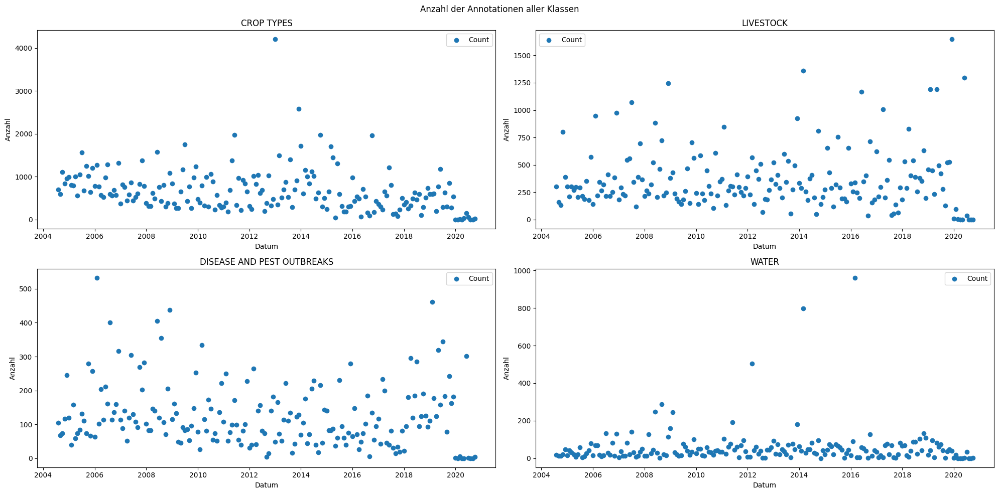

In [116]:
import matplotlib.pyplot as plt
import numpy as np
import math

# Sample data (replace this with your actual data)
classes_to_plot = ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]
num_classes = len(classes_to_plot)

# Filter data to start from August 2004
df_melted_filtered = df_melted[df_melted['Date'] >= '2004-08-01']

# Create the figure and subplots
plt.figure(figsize=(20, 10))
for i, class_name in enumerate(classes_to_plot, start=1):
    plt.subplot(2, 2, i)
    group = df_melted_filtered[df_melted_filtered['Class'] == class_name]
    plt.scatter(group['Date'], group['Count'], label='Count')
    plt.xlabel('Datum')
    plt.ylabel('Anzahl')
    plt.title(class_name)
    plt.legend()

plt.suptitle('Anzahl der Entitäten aller Klassen')
plt.tight_layout()
plt.show()


**All CLasses with date in CSV file

In [115]:
import csv

# Assuming monthly_class_counts is your dictionary containing monthly counts

# Define the file name
file_name = "monthly_class_counts.csv"

# Define the headers for the CSV file
headers = ["Month"] + categories

# Open the CSV file in write mode and write the headers
with open(file_name, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(headers)
    
    # Iterate over each month and write the counts to the CSV file
    for month, counts in monthly_class_counts.items():
        row = [month] + [counts.get(cat, 0) for cat in categories]
        writer.writerow(row)

print("CSV file saved successfully.")


CSV file saved successfully.


**PEARSON

In [10]:
import csv
from scipy.stats import pearsonr

# Load the updated CSV file containing monthly class counts and weather data
file_name = "updated_monthly_class_counts.csv"

# Initialize lists to store "CROP TYPES" and "Precipitation" data
crop_types = []
precipitation = []

# Read the data from the CSV file starting from August 2004
with open(file_name, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        # Check if the date is from August 2004 or later
        if row['Month'] >= '2004-08':
            # Append "CROP TYPES" and "Precipitation" data to respective lists
            crop_types.append(int(row['CROP TYPES']))
            precipitation.append(float(row['Temperature']))

# Calculate Pearson correlation coefficient between "CROP TYPES" and "Precipitation"
correlation_coefficient, _ = pearsonr(crop_types, precipitation)

# Print correlation coefficient
print(f"Pearson correlation coefficient between 'WATER' and 'Temperature': {correlation_coefficient}")


Pearson correlation coefficient between 'WATER' and 'Temperature': 0.0227207127130057


**KENDALL

In [190]:
import csv
import numpy as np
from scipy.stats import kendalltau

# Load the updated CSV file containing monthly class counts and weather data
file_name = "updated_monthly_class_counts.csv"

# Initialize lists to store "CROP TYPES" and "Precipitation" data
crop_types = []
precipitations = []

# Read the data from the CSV file
with open(file_name, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        # Append "CROP TYPES" and "Precipitation" data to respective lists
        crop_types.append(int(row['CROP TYPES']))
        precipitations.append(float(row['Temperature']))

# Calculate Kendall correlation coefficient between "CROP TYPES" and "Precipitation"
correlation_coefficient, _ = kendalltau(crop_types, precipitations)

# Print correlation coefficient
print(f"Kendall correlation coefficient between 'CROP TYPES' and 'Temperature': {correlation_coefficient}")


Kendall correlation coefficient between 'CROP TYPES' and 'Temperature': 0.02293166080334048


**SPEARMAN RANK

In [200]:
import csv
import numpy as np
from scipy.stats import spearmanr

# Load the updated CSV file containing monthly class counts and weather data
file_name = "updated_monthly_class_counts.csv"

# Initialize lists to store "CROP TYPES" and "Temperature" data
crop_types = []
temperatures = []

# Read the data from the CSV file
with open(file_name, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        # Append "CROP TYPES" and "Temperature" data to respective lists
        crop_types.append(int(row['WATER']))
        temperatures.append(float(row['Temperature']))

# Calculate Spearman rank correlation coefficient between "CROP TYPES" and "Temperature"
correlation_coefficient, _ = spearmanr(crop_types, temperatures)

# Print correlation coefficient
print(f"Spearman rank correlation coefficient between 'WATER' and 'Temperature': {correlation_coefficient}")


Spearman rank correlation coefficient between 'WATER' and 'Temperature': -0.04185071684731667


**Kreuzkorrelation

In [1]:
import csv
import numpy as np

# Funktion zur Berechnung der Kreuzkorrelation
def cross_correlation(x, y):
    # Kreuzkorrelation berechnen
    cross_corr = np.correlate(x, y, mode='full')
    
    # Die Kreuzkorrelationsfunktion wird an der Mitte der Ausgabe abgeschnitten
    lag = len(x) - 1
    cross_corr = cross_corr[lag:]
    
    return cross_corr

# Dateiname der CSV-Datei
file_name = "updated_monthly_class_counts.csv"

# Listen für "WATER" und "Temperature" Daten initialisieren
crop_types = []
temperatures = []

# Daten aus der CSV-Datei lesen
with open(file_name, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        # "WATER" und "Temperature" Daten an die jeweiligen Listen anhängen
        crop_types.append(int(row['WATER']))
        temperatures.append(float(row['Temperature']))

# Kreuzkorrelation zwischen "WATER" und "Temperature" berechnen
cross_corr_result = cross_correlation(crop_types, temperatures)

# Ergebnis ausgeben
print("Kreuzkorrelation zwischen 'WATER' und 'Temperature':", cross_corr_result)


Kreuzkorrelation zwischen 'WATER' und 'Temperature': [3.21288892e+06 3.20845614e+06 3.19816840e+06 3.19983611e+06
 3.20599355e+06 3.21485872e+06 3.22140092e+06 3.23359873e+06
 3.23455500e+06 3.22848854e+06 3.22185546e+06 3.21983200e+06
 3.21025115e+06 3.20183484e+06 3.20080012e+06 3.19487884e+06
 3.20858322e+06 3.21058714e+06 3.22522729e+06 3.23154370e+06
 3.23419618e+06 3.23497359e+06 3.22128106e+06 3.21883746e+06
 3.21165415e+06 3.20060706e+06 3.19039945e+06 3.20185050e+06
 3.20175349e+06 3.20940472e+06 3.21866724e+06 3.22474017e+06
 3.23151434e+06 3.22452828e+06 3.22211117e+06 3.21584902e+06
 3.20484841e+06 3.19628800e+06 3.19411940e+06 3.19174408e+06
 3.20021315e+06 3.20737314e+06 3.21869145e+06 3.22339747e+06
 3.22936774e+06 3.23143805e+06 3.21906882e+06 3.21528786e+06
 3.20467980e+06 3.19777919e+06 3.15047417e+06 3.15704174e+06
 3.12411939e+06 3.12471110e+06 3.13096253e+06 3.13073346e+06
 3.12909727e+06 3.12509408e+06 3.10360223e+06 3.09196241e+06
 3.07148060e+06 3.05442437e+06 3

In [9]:
import csv
import numpy as np

# Funktion zur Berechnung der Kreuzkorrelation
def cross_correlation(x, y):
    # Kreuzkorrelation berechnen
    cross_corr = np.correlate(x, y, mode='full')
    
    # Die Kreuzkorrelationsfunktion wird an der Mitte der Ausgabe abgeschnitten
    lag = len(x) - 1
    cross_corr = cross_corr[lag:]
    
    return cross_corr

# Dateiname der CSV-Datei
file_name = "updated_monthly_class_counts.csv"

# Listen für "WATER" und "Temperature" Daten initialisieren
crop_types = []
temperatures = []

# Daten aus der CSV-Datei lesen
with open(file_name, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        # "WATER" und "Temperature" Daten an die jeweiligen Listen anhängen
        crop_types.append(int(row['LIVESTOCK']))
        temperatures.append(float(row['Precipitation']))

# Kreuzkorrelation zwischen "WATER" und "Temperature" berechnen
cross_corr_result = cross_correlation(crop_types, temperatures)

# Gemittelter Wert der Kreuzkorrelation berechnen
average_cross_corr = np.mean(cross_corr_result)

# Ergebnis ausgeben
print("Gemittelter Wert der Kreuzkorrelation über den gesamten Datensatz:", average_cross_corr)


Gemittelter Wert der Kreuzkorrelation über den gesamten Datensatz: 3749530.1660376424


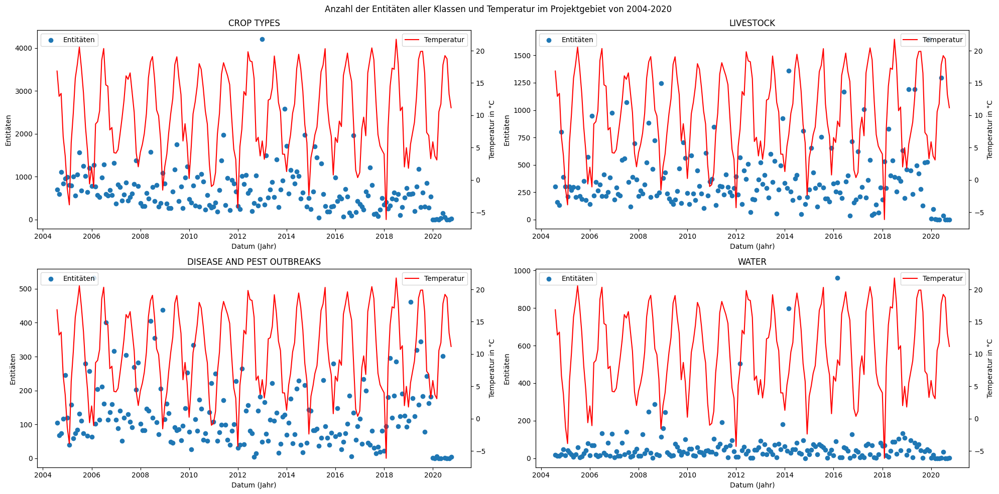

In [108]:
import matplotlib.pyplot as plt
import numpy as np
import math

# Sample data (replace this with your actual data)
classes_to_plot = ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]
num_classes = len(classes_to_plot)

# Filter data to start from August 2004
df_melted_filtered = df_melted[df_melted['Date'] >= '2004-08-01']

# Create the figure and subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
axes = axes.flatten()

for i, class_name in enumerate(classes_to_plot):
    ax = axes[i]
    group = df_melted_filtered[df_melted_filtered['Class'] == class_name]
    ax.scatter(group['Date'], group['Count'], label='Entitäten')
    ax.set_xlabel('Datum (Jahr)')
    ax.set_ylabel('Entitäten')

    # Adding second y-axis for temperature
    ax2 = ax.twinx()
    temperature_group = df_melted[df_melted['Class'] == 'Temperature']
    temperature_group = temperature_group[temperature_group['Date'] >= '2004-08-01']
    ax2.plot(temperature_group['Date'], temperature_group['Count'], color='red', label='Temperatur')
    ax2.set_ylabel('Temperatur in °C')

    ax.set_title(class_name)
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

plt.suptitle('Anzahl der Entitäten aller Klassen und Temperatur im Projektgebiet von 2004-2020 ')
plt.tight_layout()
plt.show()

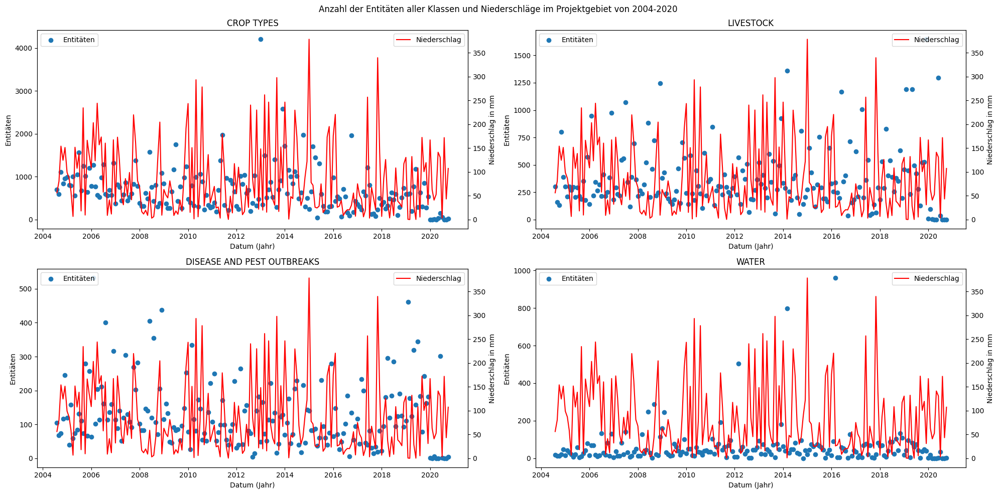

In [112]:
import matplotlib.pyplot as plt
import numpy as np
import math

# Sample data (replace this with your actual data)
classes_to_plot = ["CROP TYPES", "LIVESTOCK", "DISEASE AND PEST OUTBREAKS", "WATER"]
num_classes = len(classes_to_plot)

# Filter data to start from August 2004
df_melted_filtered = df_melted[df_melted['Date'] >= '2004-08-01']

# Create the figure and subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
axes = axes.flatten()

for i, class_name in enumerate(classes_to_plot):
    ax = axes[i]
    group = df_melted_filtered[df_melted_filtered['Class'] == class_name]
    ax.scatter(group['Date'], group['Count'], label='Entitäten')
    ax.set_xlabel('Datum (Jahr)')
    ax.set_ylabel('Entitäten')

    # Adding second y-axis for temperature
    ax2 = ax.twinx()
    temperature_group = df_melted[df_melted['Class'] == 'Prec']
    temperature_group = temperature_group[temperature_group['Date'] >= '2004-08-01']
    ax2.plot(temperature_group['Date'], temperature_group['Count'], color='red', label='Niederschlag')
    ax2.set_ylabel('Niederschlag in mm')


    ax.set_title(class_name)
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

plt.suptitle('Anzahl der Entitäten aller Klassen und Niederschläge im Projektgebiet von 2004-2020 ')
plt.tight_layout()
plt.show()